# CIFAR-10 LeNet Convolutional Neural Network Analysis

>[CIFAR-10 LeNet Convolutional Neural Network Analysis](#scrollTo=_pb5Ne_gxrbS)

>[Preparation](#scrollTo=1LzfpxGcxrbV)

>>[1.1 Import packages](#scrollTo=1LzfpxGcxrbV)

>>[1.2 Instantiation of hyperparameters](#scrollTo=FaYTCR_-xrby)

>[Dataset Loading](#scrollTo=Pu3gtXlQxrcO)

>[Data preprocessing](#scrollTo=wMfKuoAzxrdB)

>[Model Building](#scrollTo=fsgiTINgxrem)

>>[4.1 Model Training Helper Functions](#scrollTo=fsgiTINgxrem)

>>>[4.1.1 General](#scrollTo=fsgiTINgxrem)

>>>[4.1.2 Model-Specific Creation](#scrollTo=0Bzfq91mPgvj)

>>>>[4.1.2.1 LeNet-5](#scrollTo=0Bzfq91mPgvj)

>>>>[4.1.2.2 LeNet-5 (with Data Augmentation)](#scrollTo=NDNANuDrxrho)

>>>>[4.1.2.3 AlexNet](#scrollTo=ZMOm6fDLRHfK)

>>>>[4.1.2.3 VGG-16](#scrollTo=4lf-pNCmRPDb)

>>>>[4.1.2.4 Custom](#scrollTo=0T05Va2ARabL)

>[Model Training & Evaluation](#scrollTo=dtwn6OUdxrfx)

>>[5.1. LeNet](#scrollTo=dtwn6OUdxrfx)

>>>[5.1.1 LeNet (No Regularization)](#scrollTo=dtwn6OUdxrfx)

>>>[5.1.2. LeNet (with Dropout)](#scrollTo=KJ7OrT0c3kxh)

>>>[5.1.3. LeNet (with L1/L2 Regularization)](#scrollTo=381vXjkhmy0U)

>>>>[5.1.3.1. LeNet (with L1 Regularization)](#scrollTo=381vXjkhmy0U)

>>>>[5.1.3.2. LeNet (with L2 Regularization)](#scrollTo=tLyU368uq062)

>>>[5.1.4. LeNet (with Data Augmentation)](#scrollTo=8UcBpgPGkKcF)

>>>[5.1.5. LeNet (with Early Stopping)](#scrollTo=zMAUOSEAluuO)

>>>[5.1.6. LeNet (with mixed regularization)](#scrollTo=-gW8paA_tuaV)

>>>[5.1.7. LeNet (with Batch Normalization)](#scrollTo=BYzj9my96-Vt)

>>>[5.1.8. LeNet (with mixed regularization/ Batch Normalization)](#scrollTo=VqCIp1QG-zjX)

>>>[5.1.9. Performance Comparison of base/ regularized models](#scrollTo=WYQkvoJmaHca)

>>[5.2. AlexNet](#scrollTo=u2HN4o-iPi9f)

>>[5.4. VGG-16](#scrollTo=soTbRUuzkj2I)

>[Visualizing the wrongly classified data](#scrollTo=rO49_VbFxrgX)

>>[6.1. Helper Functions](#scrollTo=rO49_VbFxrgX)

>>[6.2. Plot sample images of cats misclassified as dogs by the LeNet model](#scrollTo=X3Y1IBlh_WRF)

>>[6.3. Plot sample images of dogs misclassified as cats by the LeNet model](#scrollTo=9ZNi8g_o_h9P)

>[LeNet Model Tuning](#scrollTo=rWxTmcbOxrhC)

>>[7.1. Model Tuning Helper Functions](#scrollTo=i9BLYjyBMsYR)

>>[7.2. Batch Size](#scrollTo=ZldeEpI4Mn8h)

>>[7.3. Training Optimization Algorithm](#scrollTo=WEbMMlxZGk6G)

>>[7.4. Network Weight Initialization](#scrollTo=ZrDItZyiGyo4)

>>[7.5. Neuron Activation Function](#scrollTo=ycQ-sZCtHGAc)

>>[7.6. Number of Neurons in the Hidden Layer](#scrollTo=TyAckh24Hyba)



# 1. Preparation

## 1.1 Import packages
Here we are using [Keras](https://github.com/keras-team/keras) with [TensorFlow](https://www.tensorflow.org/) backend to develop a **convolutional neural network (CNN)** to training the classification of objects in the [CIFAR-10 dataset](https://www.cs.toronto.edu/~kriz/cifar-10-python.tar.gz)

In [0]:
import datetime

import numpy
import scipy as sp

import pickle

import keras
from keras import callbacks
from keras.callbacks import CSVLogger
from keras.callbacks import EarlyStopping
from keras import regularizers
from keras.datasets import cifar10
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D, Activation, BatchNormalization
from keras.optimizers import Adagrad
from keras.optimizers import SGD
from keras import backend as K
from keras.constraints import maxnorm
from keras.applications.vgg16 import VGG16
from keras.applications.vgg19 import VGG19
from keras.applications.xception import Xception
from keras.applications.resnet50 import ResNet50
from keras.applications.inception_v3 import InceptionV3
from keras.applications.inception_resnet_v2 import InceptionResNetV2
from keras.applications.mobilenet import MobileNet
from keras.applications.densenet import DenseNet201
from keras.applications.nasnet import NASNetMobile
from keras.applications.mobilenet_v2 import MobileNetV2
from keras.preprocessing.image import ImageDataGenerator

# Use scikit-learn to grid search the batch size and epochs
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from keras.models import Sequential
from keras.layers import Dense
from keras.wrappers.scikit_learn import KerasClassifier
from keras.constraints import maxnorm

from sklearn.metrics import classification_report, confusion_matrix, precision_recall_fscore_support

# fix random seed for reproducibility
seed = 7
numpy.random.seed(seed)

import numpy as np
from keras.utils import np_utils
import matplotlib.pyplot as plt
from PIL import Image
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
plt.style.use('ggplot')
from IPython.display import Image


# Just disables the warning, doesn't enable AVX/FMA
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'

Using TensorFlow backend.


In [0]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

In [0]:
!unzip img.zip -d ./

Archive:  img.zip
   creating: ./img/
  inflating: ./img/AlexNet.png       
  inflating: ./img/lenet5.png        
  inflating: ./img/vgg16.png         


## 1.2 Instantiation of hyperparameters
Here we instantiate the values of hyperparameters that we will be using later,


In [0]:
batch_size = 32
num_classes = 10
epochs = 100

We explicitly define our CIFAR-10 image dimensions which will be used later to reshape our data.

In [0]:
# fill in the image dimensions of a single data from the MNIST dataset
# img_rows, img_cols = *your answer here*

img_rows, img_cols = 32, 32

# 2. Dataset Loading
We load our CIIFAR-10 data.

In [0]:
# Write down the function that will load your cifar10 data
(x_train, y_train), (x_test, y_test) = cifar10.load_data()

170500096/170498071 [==============================] - 30s 0us/step


Airplane (Total: 5000)


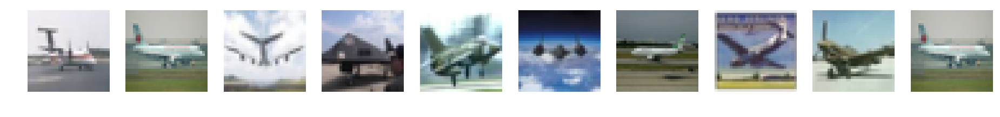

Automobile (Total: 5000)


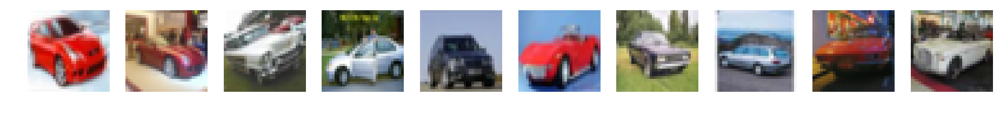

Bird (Total: 5000)


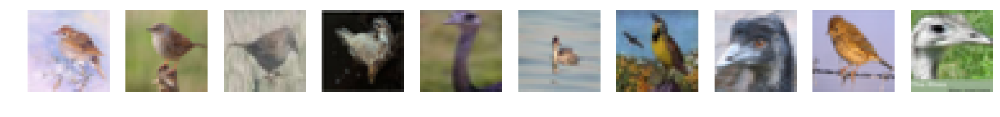

Cat (Total: 5000)


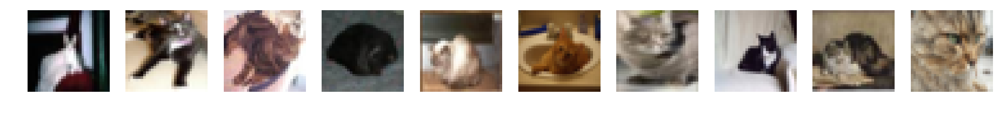

Deer (Total: 5000)


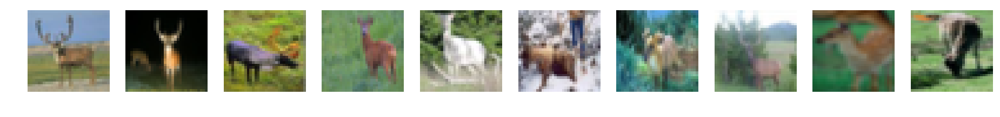

Dog (Total: 5000)


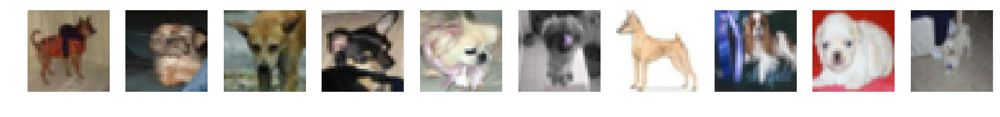

Frog (Total: 5000)


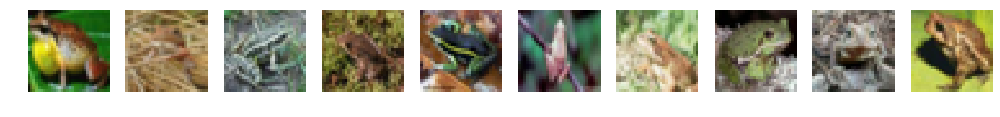

Horse (Total: 5000)


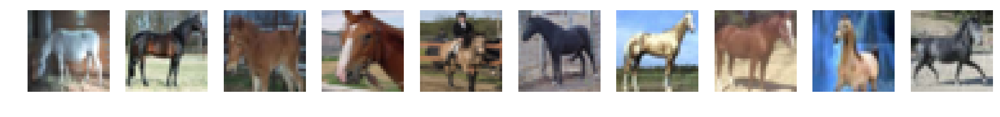

Ship (Total: 5000)


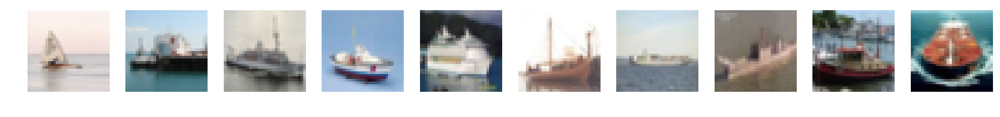

Truck (Total: 5000)


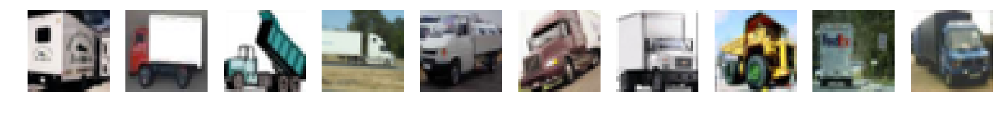

In [0]:
import numpy as np
from random import *

cnt = [0] * 10

cnt = {'airplane':0, 'automobile':0, 'bird':0, 'cat':0, 'deer':0, 'dog':0, 'frog':0, 'horse':0, 'ship':0, 'truck':0}
imgs = {'airplane':[], 'automobile':[], 'bird':[], 'cat':[], 'deer':[], 'dog':[], 'frog':[], 'horse':[], 'ship':[], 'truck':[]}

names = ['airplane',
        'automobile',
        'bird',
        'cat',
        'deer',
        'dog',
        'frog',
        'horse',
        'ship',
        'truck']

for i, lbl in enumerate(y_train):
  idx = np.asscalar(lbl)
  cnt[names[idx]] += 1
  imgs[names[idx]].append(x_train[i])

w=25
h=25
fig=plt.figure(figsize=(16, 16))
columns = 10
rows = 1

for key in imgs.keys():
  print('\x1b[1;31m' + key.capitalize() + " (Total: " + str(cnt[key]) + ")" + '\x1b[0m')
  fig=plt.figure(figsize=(16, 16))
  for i in range(1, columns*rows +1):
      fig.add_subplot(rows, columns, i)
      plt.axis('off')
      plt.imshow(imgs[key][randint(1, cnt[key])], cmap=plt.get_cmap('gray'), interpolation='none')
  plt.show()

In [0]:
# Lets determine the dataset characteristics
print('Training Images: {}'.format(x_train.shape))
print('Testing Images: {}'.format(x_test.shape))

Training Images: (50000, 32, 32, 3)
Testing Images: (10000, 32, 32, 3)


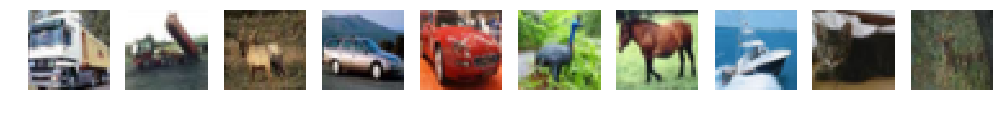

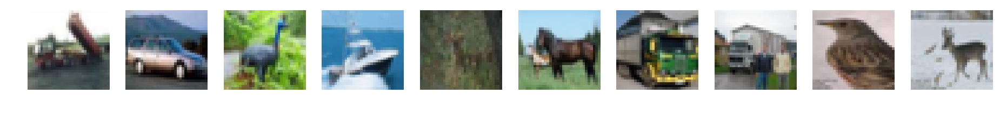

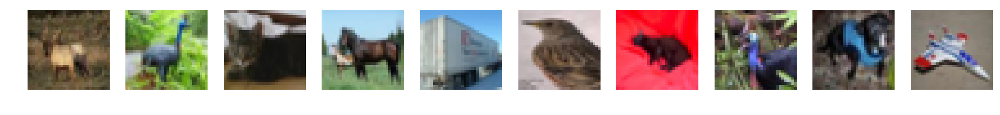

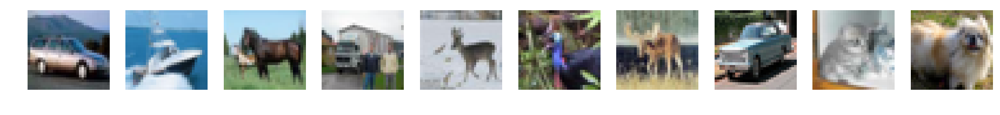

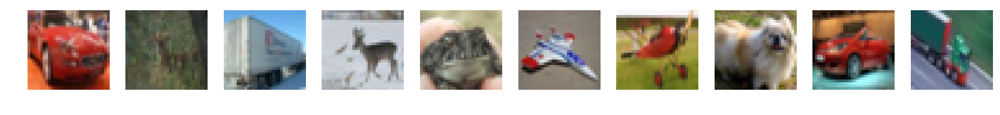

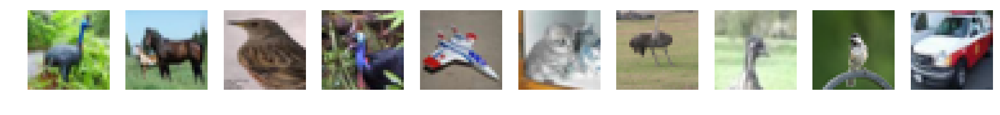

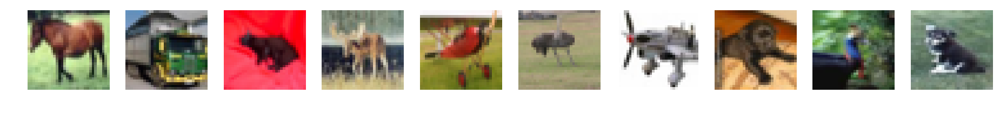

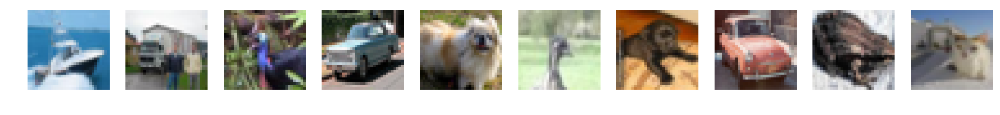

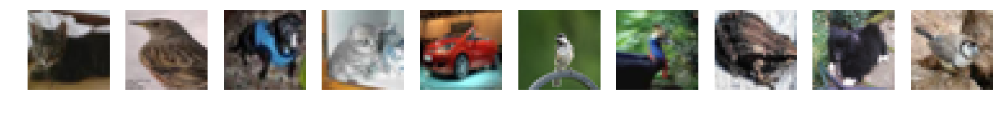

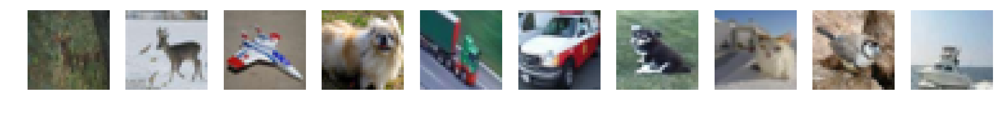

In [0]:
plt.rcParams["figure.figsize"] = (16,16)
  
for i in range(10):
  for j in range(10):
    plt.subplot2grid((10,10), (i,j))
    plt.axis('off')
    plt.imshow(x_train[(i+1)*(j+1)], cmap=plt.get_cmap('gray'), aspect='auto')
  plt.show()

# 3. Data preprocessing

In [0]:
if K.image_data_format() == 'channels_first':
    x_train = x_train.reshape(x_train.shape[0], 3, img_rows, img_cols)
    x_test = x_test.reshape(x_test.shape[0], 3, img_rows, img_cols)
    input_shape = (3, img_rows, img_cols)
else:
    x_train = x_train.reshape(x_train.shape[0], img_rows, img_cols, 3)
    x_test = x_test.reshape(x_test.shape[0], img_rows, img_cols, 3)
    input_shape = (img_rows, img_cols, 3)

We also normalize the pixel values and convert class vectors to binary class matrices.

In [0]:
x_train = x_train.astype('float32')
x_test = x_test.astype('float32')
x_train /= 255
x_test /= 255
print('x_train shape:', x_train.shape)
print(x_train.shape[0], 'train samples')
print(x_test.shape[0], 'test samples')

y_train = keras.utils.to_categorical(y_train, num_classes)
y_test = keras.utils.to_categorical(y_test, num_classes)

x_train shape: (50000, 32, 32, 3)
50000 train samples
10000 test samples


# 4. Model Building

## 4.1 Model Training Helper Functions

### 4.1.1 General

Here, we define helper functions for training and evaluating the different variations of the LeNet model (with/ without regularization) and other models e.g. VGG-16, AlexNet

In [0]:
# Model Training Helper Function
def TrainModel(modelName, x_train, y_train, x_test, y_test, useEarlyStopping=False):

  if(modelName == "LeNet"):
    model = createNN_LeNet()
  elif(modelName == "LeNet_BN"):
    model = createNN_LeNet(batch_normalization=True)
  elif(modelName == "LeNet_Dropout"):
    model = createNN_LeNet(dropout=0.2)  
  elif(modelName == "LeNet_L1"):
    model = createNN_LeNet(kernel_regularizer=regularizers.l1(0.0001))  
  elif(modelName == "LeNet_L2"):
    model = createNN_LeNet(kernel_regularizer=regularizers.l2(0.0001))  
  elif(modelName == "Custom"):
    model = createNN_Custom()  
  elif(modelName == "AlexNet"):
    model = createNN_AlexNet()
  elif(modelName == "VGGNet"):
    model = createNN_VGGNet()    
    
  model.compile(loss=keras.losses.categorical_crossentropy,
                  optimizer=SGD(lr=0.01),
                  metrics=['accuracy'])
    
  model_checkpoints = callbacks.ModelCheckpoint("weights_{epoch:02d}_{val_loss:.2f}.h5", monitor='val_loss',
                                                      verbose=1, save_best_only=True, save_weights_only=False, mode='auto', period=1)
  csv_logger = CSVLogger(modelName + '_training.log')
  early_stopping = EarlyStopping(monitor='val_loss', min_delta=0, patience=10, verbose=0, mode='auto', baseline=None, restore_best_weights=False)
  
  if(useEarlyStopping == True):
    callbacks_=[model_checkpoints, csv_logger, early_stopping]
  else:
    callbacks_=[model_checkpoints, csv_logger]
  
  now = datetime.datetime.now
  t = now()
  
  model_log = model.fit(x_train, y_train,
                   batch_size=batch_size, # number of samples to be used for each gradient update
                   epochs=epochs, # number of iterations over the entire x_train data
                   validation_data=(x_test, y_test), # on which to evaluate loss and model metrics at the end of each epoch
                   verbose=0,
                   callbacks=callbacks_)
  training_time = now() - t
  return model, model_log, training_time

In [0]:
# Plots the accuracy and loss curves from a single model training log
def plotAccuracyLoss(model_log):
  f, (ax1, ax2) = plt.subplots(1, 2,figsize=(15,5))

  ax1.plot(model_log.history['acc'])
  ax1.plot(model_log.history['val_acc'])
  ax1.set_title('Accuracy (Higher Better)')
  ax1.set(xlabel='Epoch', ylabel='Accuracy')
  ax1.legend(['train', 'validation'], loc='lower right')

  ax2.plot(model_log.history['loss'])
  ax2.plot(model_log.history['val_loss'])
  ax2.set_title('Loss (Lower Better)')
  ax2.set(xlabel='Epoch', ylabel='Loss')
  ax2.legend(['train', 'validation'], loc='upper right')

In [0]:
# Plots the accuracy and loss curves from multiple model training logs for comparison
def plotAccuracyLossComparison(model_logs):   
  f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4,figsize=(15,5))

  for key in model_logs.keys(): 
    ax1.plot(model_logs[key].history['acc'])
    ax1.set_title('Accuracy (Higher Better)')
    ax1.set(xlabel='Epoch', ylabel='Accuracy')
    ax1.legend(model_logs.keys(), loc='lower right')
    
    ax2.plot(model_logs[key].history['val_acc'])
    ax2.set_title('Accuracy (Higher Better)')
    ax2.set(xlabel='Epoch', ylabel='Accuracy')
    ax2.legend(model_logs.keys(), loc='lower right')

    ax3.plot(model_logs[key].history['loss'])
    ax3.set_title('Loss (Lower Better)')
    ax3.set(xlabel='Epoch', ylabel='Loss')
    ax3.legend(model_logs.keys(), loc='upper right')
    
    ax4.plot(model_logs[key].history['val_loss'])
    ax4.set_title('Loss (Lower Better)')
    ax4.set(xlabel='Epoch', ylabel='Loss')
    ax4.legend(model_logs.keys(), loc='upper right')

In [0]:
# Plots the confusion matrix for specified model and test datasets
def plotConfusionMatrix(modelName, model, x_test, y_test):
  # Confusion matrix result
  Y_pred = model.predict(x_test, verbose=2)
  y_pred = np.argmax(Y_pred, axis=1)

  cm = confusion_matrix(np.argmax(y_test,axis=1),y_pred)

  # Visualizing of confusion matrix
  import seaborn as sn
  import pandas  as pd

  df_cm = pd.DataFrame(cm, names, names)
  
  df_cm.to_csv(modelName + "_CM.csv")
    
  plt.figure(figsize = (15,10))
  plt.ylabel = 'Actual'
  plt.xlabel ='Predicted'
  sn.set(font_scale=1.4)#for label size

  ax = sn.heatmap(df_cm, annot=True,annot_kws={"size": 11}, fmt='g')# font size
  ax.collections[0].colorbar.set_label("Quantity")
  ax.set_title('Confusion Matrix for LeNet-5 CNN predictions for CIFAR-10 dataset')
  ax.set_ylabel('Actual')
  ax.set_xlabel('Predicted')

  plt.show()
  
  return y_pred, y_test

In [0]:
# Prints the classification report based on predicted and actual dataset labels
def plotClassificationReport(y_pred, y_test, names):
  report = classification_report(y_true=np.argmax(y_test,axis=1), 
                                             y_pred=y_pred, 
                                             target_names=names) 
  print(report)

In [0]:
# Prints the loss and accuracy scores for evaluated model
def printTestStats(model, x_test, y_test):
  score = model.evaluate(x_test, y_test, verbose=0)
  print('Test loss:', score[0])
  print('Test accuracy:', score[1])
  return score

### 4.1.2 Model-Specific Creation

#### 4.1.2.1 LeNet-5
Convolution neural network based from a  paper titled [Gradient-Based Learning Applied to Document Recognition](http://yann.lecun.com/exdb/publis/pdf/lecun-01a.pdf) in 1998 by Yann Lecun, Leon Bottou, Yoshua Bengio and Patrick Haffner.

In [0]:
#Image('img/lenet5.png')

In [0]:
# Creates LeNet model from input parameters
def createNN_LeNet(init_mode='glorot_uniform', activation='relu', neurons=84, dropout=0.0, kernel_regularizer=None, batch_normalization=False):
  if(batch_normalization == False):
    feature_layers = [
      Conv2D(6, kernel_size=(5,5), 
                            strides=(1,1),
                            padding='same', # adds sufficient padding to the input so that the output has same dimension as input
                            input_shape=input_shape,
                            use_bias=True, 
                            kernel_initializer=init_mode,
                            kernel_regularizer=kernel_regularizer,
                            bias_initializer='zeros'),
      Activation(activation),
      MaxPooling2D(pool_size=(2, 2), strides=(2, 2)),
      Dropout(rate=dropout),
      Conv2D(16, kernel_size=(5,5), padding='valid', kernel_regularizer=kernel_regularizer),
      Activation(activation),
      MaxPooling2D(pool_size=(2, 2), strides=(2, 2)),
      Dropout(rate=dropout),
      Conv2D(120, kernel_size=(5,5), padding='valid', kernel_regularizer=kernel_regularizer),
      Activation(activation),
      Dropout(rate=dropout),
      Flatten()
    ]


    classification_layers = [
      Dropout(rate=dropout),
      Dense(neurons, kernel_regularizer=kernel_regularizer),
      Dropout(rate=dropout),
      Dense(num_classes),
      Activation('softmax')
    ]
    
  elif(batch_normalization == True):
    feature_layers = [
      Conv2D(6, kernel_size=(5,5), 
                            strides=(1,1),
                            padding='same', # adds sufficient padding to the input so that the output has same dimension as input
                            input_shape=input_shape,
                            use_bias=True, 
                            kernel_initializer=init_mode,
                            kernel_regularizer=kernel_regularizer,
                            bias_initializer='zeros'),
      BatchNormalization(),
      Activation(activation),
      MaxPooling2D(pool_size=(2, 2), strides=(2, 2)),
      Dropout(rate=dropout),
      Conv2D(16, kernel_size=(5,5), padding='valid', kernel_regularizer=kernel_regularizer),
      BatchNormalization(),
      Activation(activation),
      MaxPooling2D(pool_size=(2, 2), strides=(2, 2)),
      Dropout(rate=dropout),
      Conv2D(120, kernel_size=(5,5), padding='valid', kernel_regularizer=kernel_regularizer),
      BatchNormalization(),
      Activation(activation),
      Dropout(rate=dropout),
      Flatten()
    ]


    classification_layers = [
      Dropout(rate=dropout),
      Dense(neurons, kernel_regularizer=kernel_regularizer),
      BatchNormalization(),
      Dropout(rate=dropout),
      Dense(num_classes),
      Activation('softmax')
    ]        

  model = Sequential(feature_layers + classification_layers)
  return model

#### 4.1.2.2 LeNet-5 (with Data Augmentation)


In [0]:
# Perform model training using data augmentation
def TrainAugmentedModel(modelName, x_train, y_train, x_test, y_test, init_mode='glorot_uniform', activation='relu', 
                        neurons=84, dropout=0.0, kernel_regularizer=None, useEarlyStopping=False, batch_normalization=False):

  # Create augmentation configuration
  datagen = ImageDataGenerator(
      featurewise_center=False,  # set input mean to 0 over the dataset
      samplewise_center=False,  # set each sample mean to 0
      featurewise_std_normalization=False,  # divide inputs by std of the dataset
      samplewise_std_normalization=False,  # divide each input by its std
      zca_whitening=False,  # apply ZCA whitening
      zca_epsilon=1e-06,  # epsilon for ZCA whitening
      rotation_range=0,  # randomly rotate images in the range (degrees, 0 to 180)
      # randomly shift images horizontally (fraction of total width)
      width_shift_range=0.1,
      # randomly shift images vertically (fraction of total height)
      height_shift_range=0.1,
      shear_range=0.,  # set range for random shear
      zoom_range=0.,  # set range for random zoom
      channel_shift_range=0.,  # set range for random channel shifts
      # set mode for filling points outside the input boundaries
      fill_mode='nearest',
      cval=0.,  # value used for fill_mode = "constant"
      horizontal_flip=False,  # randomly flip images
      vertical_flip=False,  # randomly flip images
      # set rescaling factor (applied before any other transformation)
      rescale=None,
      # set function that will be applied on each input
      preprocessing_function=None,
      # image data format, either "channels_first" or "channels_last"
      data_format=None,
      # fraction of images reserved for validation (strictly between 0 and 1)
      validation_split=0.0)

  train_generator = datagen.flow(x_train, y_train)

  validation_generator = datagen.flow(x_test, y_test)

  if(batch_normalization == False):
    model = createNN_LeNet(init_mode=init_mode, activation=activation, neurons=neurons, dropout=dropout, 
                           kernel_regularizer=kernel_regularizer)
  elif(batch_normalization == True):
    model = createNN_LeNet(init_mode=init_mode, activation=activation, neurons=neurons, dropout=dropout, 
                           kernel_regularizer=kernel_regularizer, batch_normalization=True)

  model.compile(loss=keras.losses.categorical_crossentropy,
                  optimizer=SGD(lr=0.01),
                  metrics=['accuracy'])
  
  # Callbacks Declaration
  model_checkpoints = callbacks.ModelCheckpoint("weights_{epoch:02d}_{val_loss:.2f}.h5", monitor='val_loss',
                                                      verbose=1, save_best_only=True, save_weights_only=False, mode='auto', period=1)
  csv_logger = CSVLogger(modelName + '_training.log')
  early_stopping = EarlyStopping(monitor='val_loss', min_delta=0, patience=10, verbose=0, mode='auto', baseline=None, restore_best_weights=False)
  
  if(useEarlyStopping == True):
    callbacks_=[model_checkpoints, csv_logger, early_stopping]
  else:
    callbacks_=[model_checkpoints, csv_logger]
    
  # fits the model on batches with real-time data augmentation:
  model_log = model.fit_generator(
          train_generator,
          steps_per_epoch=len(x_train)/32,
          epochs=epochs,
          validation_data=validation_generator,
          validation_steps=len(x_train)/32,
          callbacks=callbacks_)

  return model, model_log

#### 4.1.2.3 AlexNet

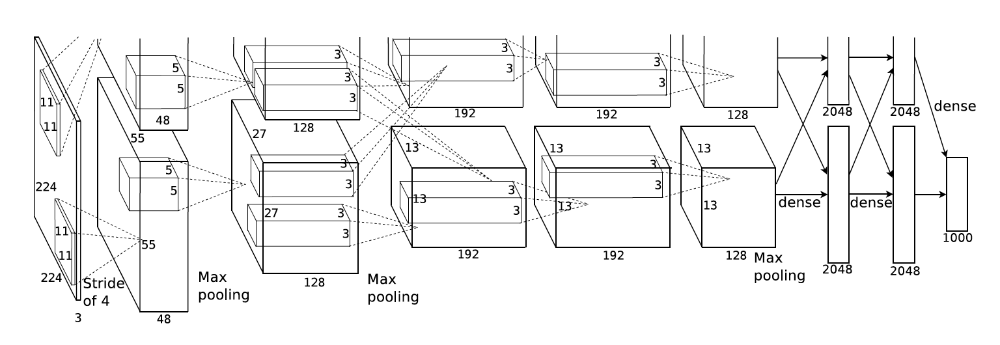

In [0]:
Image('img/AlexNet.png', width=900, height=300)

In [0]:
# Creates AlexNet model based on input parameters
def createNN_AlexNet(activation='relu', neurons=4096):
  feature_layers = [
    Conv2D(96, kernel_size=(3,3), 
                          strides=(2,2),
                          padding='same', # adds sufficient padding to the input so that the output has same dimension as input
                          input_shape=input_shape),
    BatchNormalization(),
    Activation(activation),
    MaxPooling2D(pool_size=(2, 2), strides=(2, 2)),
      
    Conv2D(256, kernel_size=(5,5), padding='same'),
    BatchNormalization(), 
    Activation(activation),
    MaxPooling2D(pool_size=(3, 3), strides=(2, 2)),  
      
    Conv2D(384, kernel_size=(3,3), padding='same'),
    BatchNormalization(),
    Activation(activation),
      
    Conv2D(384, kernel_size=(3,3), padding='same'),
    BatchNormalization(),
    Activation(activation),
      
    Conv2D(256, kernel_size=(3,3), padding='same'),
    BatchNormalization(),
    Activation(activation),
    MaxPooling2D(pool_size=(3, 3), strides=(2, 2)),    
    Flatten()
  ]


  classification_layers = [
    Dense(neurons, activation='tanh'),
    BatchNormalization(),
    Dropout(0.5),
    Dense(neurons, activation='tanh'),
    BatchNormalization(),
    Dropout(0.5),
    Dense(num_classes),
    Activation('softmax')
  ]

  model = Sequential(feature_layers + classification_layers)
  return model

#### 4.1.2.3 VGG-16

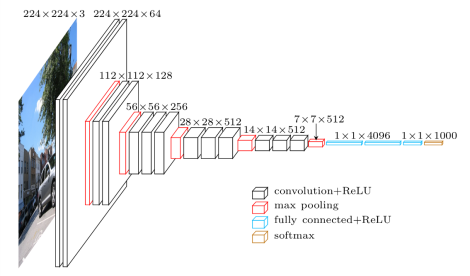

In [0]:
Image('img/vgg16.png', width=900, height=300)

In [0]:
# Creates VGG-16 model based on input parameters
def createNN_VGGNet(activation='relu', neurons=4096):
  feature_layers = [
    Conv2D(64, kernel_size=(3,3),
                          padding='same', # adds sufficient padding to the input so that the output has same dimension as input
                          input_shape=input_shape),
    BatchNormalization(),
    Activation(activation),
    Conv2D(64, kernel_size=(3,3), padding='same'),
    BatchNormalization(),
    Activation(activation),
    MaxPooling2D(pool_size=(2, 2), strides=(2, 2)),
    
    Conv2D(128, kernel_size=(3,3), padding='same'),
    BatchNormalization(),
    Activation(activation),
    Conv2D(128, kernel_size=(3,3), padding='same'),
    BatchNormalization(),
    Activation(activation),
    MaxPooling2D(pool_size=(2, 2), strides=(2, 2)), 
      
    Conv2D(256, kernel_size=(3,3), padding='same'),
    BatchNormalization(),
    Activation(activation),
    Conv2D(256, kernel_size=(3,3), padding='same'),
    BatchNormalization(),
    Activation(activation),
    Conv2D(256, kernel_size=(3,3), padding='same'),
    BatchNormalization(),
    Activation(activation),
    MaxPooling2D(pool_size=(2, 2), strides=(2, 2)),
      
    Conv2D(512, kernel_size=(3,3), padding='same'),
    BatchNormalization(),
    Activation(activation),
    Conv2D(512, kernel_size=(3,3), padding='same'),
    BatchNormalization(),
    Activation(activation),
    Conv2D(512, kernel_size=(3,3), padding='same'),
    BatchNormalization(),
    Activation(activation),
    MaxPooling2D(pool_size=(2, 2), strides=(2, 2)),  

    Conv2D(512, kernel_size=(3,3), padding='same'),
    BatchNormalization(),
    Activation(activation),
    Conv2D(512, kernel_size=(3,3), padding='same'),
    BatchNormalization(),
    Activation(activation),
    Conv2D(512, kernel_size=(3,3), padding='same'),
    BatchNormalization(),
    Activation(activation),
    MaxPooling2D(pool_size=(2, 2), strides=(2, 2)),
      
    Flatten()
  ]


  classification_layers = [
    Dense(neurons, activation=activation),
    BatchNormalization(),
    Dense(neurons, activation=activation),
    BatchNormalization(),
    Dense(num_classes),
    Activation('softmax')
  ]

  model = Sequential(feature_layers + classification_layers)
  return model

#### 4.1.2.4 Custom

In [0]:
# Creates Customized Neural Network model based on input parameters
def createNN_Custom(init_mode='glorot_uniform', activation='relu', neurons=1024):
  feature_layers = [
    Conv2D(32, kernel_size=(5,5), 
                          strides=(1,1),
                          padding='same', # adds sufficient padding to the input so that the output has same dimension as input
                          input_shape=input_shape,
                          use_bias=True, 
                          kernel_initializer=init_mode,
                          bias_initializer='zeros'),
    Dropout(0.2),
      
    Conv2D(32, kernel_size=(5,5), padding='same'),
    Activation(activation),
    MaxPooling2D(pool_size=(2, 2), strides=(2, 2)),
    
    Conv2D(64, kernel_size=(5,5), padding='same'),
    Activation(activation),
    Dropout(0.2), 
    
    Conv2D(64, kernel_size=(5,5), padding='same'),
    Activation(activation),
    MaxPooling2D(pool_size=(2, 2), strides=(2, 2)),

    Conv2D(128, kernel_size=(5,5), padding='same'),
    Activation(activation),
    Dropout(0.2), 

    Conv2D(128, kernel_size=(5,5), padding='same'),
    Activation(activation),
    MaxPooling2D(pool_size=(2, 2), strides=(2, 2)),
      
    Flatten()
  ]


  classification_layers = [
    Dropout(0.2),
    Dense(neurons),
    Activation(activation),
    Dropout(0.2),
    
    Dense(num_classes),
    Activation('softmax')
  ]

  model = Sequential(feature_layers + classification_layers)
  return model

# 5. Model Training & Evaluation

## 5.1. LeNet

### 5.1.1 LeNet (No Regularization)

In [0]:
# Perform model training using base LeNet model
model_LeNet, model_log_LeNet, model_LeNet_TrainTime = TrainModel("LeNet", x_train, y_train, x_test, y_test)


Epoch 00001: val_loss improved from inf to 1.72659, saving model to weights_01_1.73.h5

Epoch 00002: val_loss improved from 1.72659 to 1.58966, saving model to weights_02_1.59.h5

Epoch 00003: val_loss improved from 1.58966 to 1.41556, saving model to weights_03_1.42.h5

Epoch 00004: val_loss improved from 1.41556 to 1.32922, saving model to weights_04_1.33.h5

Epoch 00005: val_loss improved from 1.32922 to 1.32640, saving model to weights_05_1.33.h5

Epoch 00006: val_loss improved from 1.32640 to 1.32343, saving model to weights_06_1.32.h5

Epoch 00007: val_loss improved from 1.32343 to 1.20403, saving model to weights_07_1.20.h5

Epoch 00008: val_loss improved from 1.20403 to 1.18965, saving model to weights_08_1.19.h5

Epoch 00009: val_loss improved from 1.18965 to 1.17298, saving model to weights_09_1.17.h5

Epoch 00010: val_loss improved from 1.17298 to 1.13242, saving model to weights_10_1.13.h5

Epoch 00011: val_loss did not improve from 1.13242

Epoch 00012: val_loss did not i

In [0]:
# Save trained LeNet model to disk
model_LeNet.save('model_LeNet.h5')

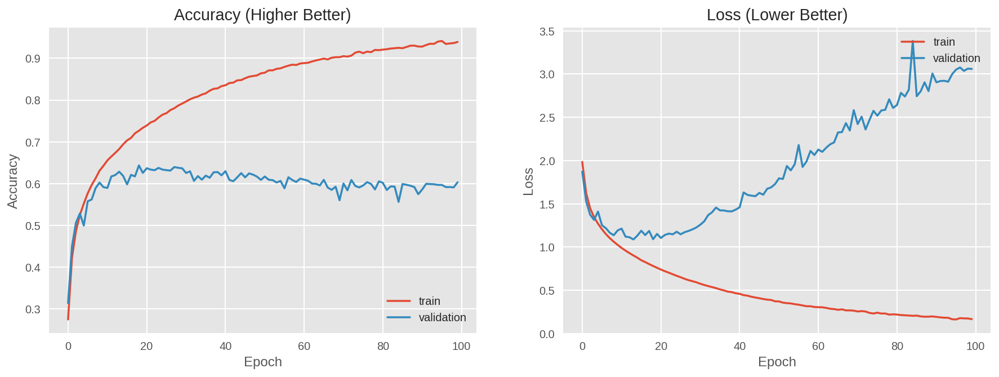

In [0]:
# Plots the accuracy/ loss curves for trained LeNet model
plotAccuracyLoss(model_log_LeNet)

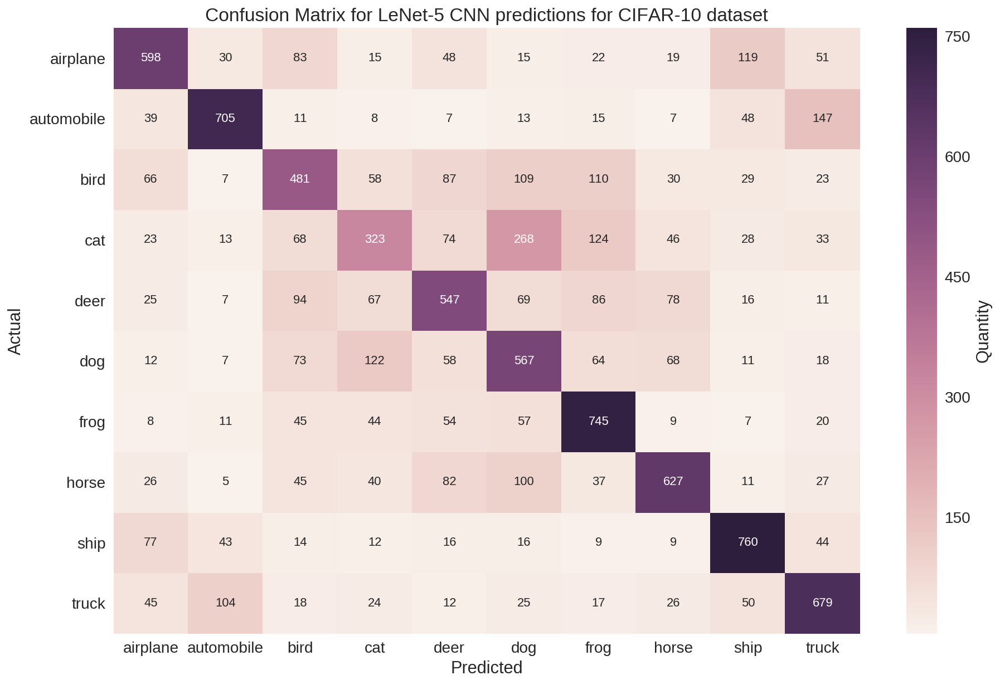

In [0]:
# Plots the confusion matrix for the trained LeNet model
LeNet_y_pred, LeNet_y_test = plotConfusionMatrix("LeNet", model_LeNet, x_test, y_test)

In [0]:
# Prints the classification report based on predicted and actual test dataset labels for the LeNet model
plotClassificationReport(LeNet_y_pred, LeNet_y_test, names)

             precision    recall  f1-score   support

   airplane       0.65      0.60      0.62      1000
 automobile       0.76      0.70      0.73      1000
       bird       0.52      0.48      0.50      1000
        cat       0.45      0.32      0.38      1000
       deer       0.56      0.55      0.55      1000
        dog       0.46      0.57      0.51      1000
       frog       0.61      0.74      0.67      1000
      horse       0.68      0.63      0.65      1000
       ship       0.70      0.76      0.73      1000
      truck       0.64      0.68      0.66      1000

avg / total       0.60      0.60      0.60     10000



In [0]:
# Evaluates the accuracy and loss scores for the test dataset using the trained LeNet model
printTestStats(model_LeNet, x_test, y_test)

Test loss: 3.059764324569702
Test accuracy: 0.6032


[3.059764324569702, 0.6032]

### 5.1.2. LeNet (with Dropout)

In [0]:
# Perform model training using LeNet model with dropout regularization
model_LeNet_Dropout, model_log_LeNet_Dropout, model_LeNet_Dropout_TrainTime = TrainModel("LeNet_Dropout", x_train, y_train, x_test, y_test)


Epoch 00001: val_loss improved from inf to 1.76794, saving model to weights_01_1.77.h5

Epoch 00002: val_loss improved from 1.76794 to 1.63200, saving model to weights_02_1.63.h5

Epoch 00003: val_loss improved from 1.63200 to 1.50152, saving model to weights_03_1.50.h5

Epoch 00004: val_loss improved from 1.50152 to 1.43350, saving model to weights_04_1.43.h5

Epoch 00005: val_loss improved from 1.43350 to 1.38249, saving model to weights_05_1.38.h5

Epoch 00006: val_loss improved from 1.38249 to 1.35855, saving model to weights_06_1.36.h5

Epoch 00007: val_loss improved from 1.35855 to 1.32543, saving model to weights_07_1.33.h5

Epoch 00008: val_loss improved from 1.32543 to 1.29389, saving model to weights_08_1.29.h5

Epoch 00009: val_loss did not improve from 1.29389

Epoch 00010: val_loss improved from 1.29389 to 1.24945, saving model to weights_10_1.25.h5

Epoch 00011: val_loss did not improve from 1.24945

Epoch 00012: val_loss improved from 1.24945 to 1.22986, saving model to

In [0]:
# Save trained LeNet model with dropout regularization to disk
model_LeNet_Dropout.save('model_LeNet_Dropout.h5')

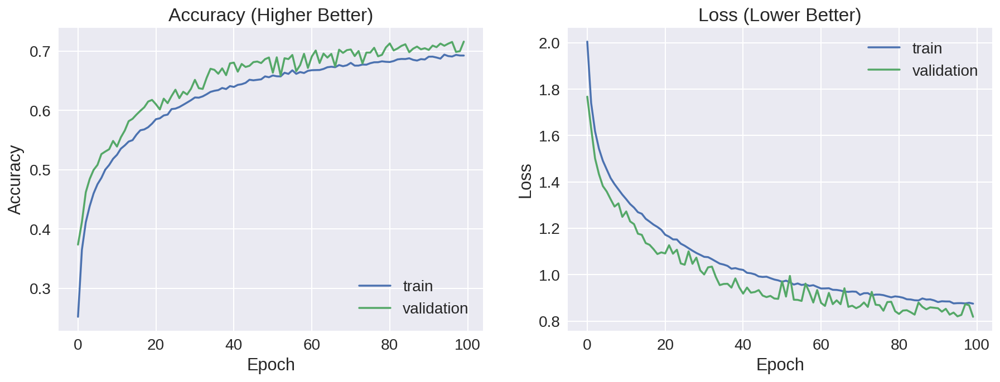

In [0]:
plotAccuracyLoss(model_log_LeNet_Dropout)

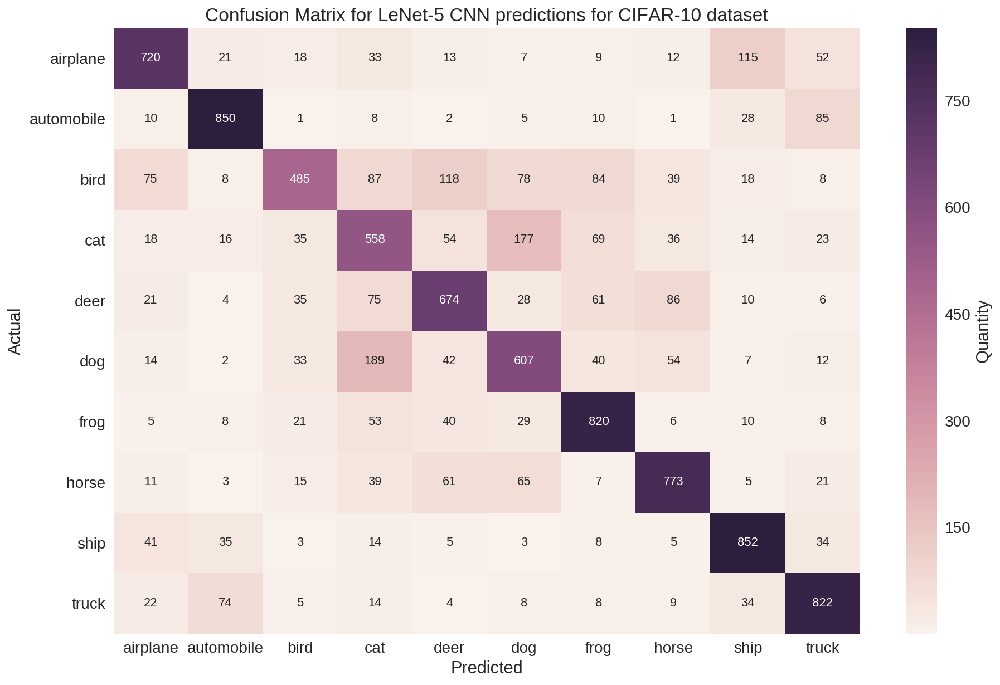

In [0]:
# Plots the confusion matrix for the trained LeNet model with dropout regularization
LeNet_Dropout_y_pred, LeNet_Dropout_y_test = plotConfusionMatrix("LeNet_Dropout", model_LeNet_Dropout, x_test, y_test)

In [0]:
# Prints the classification report based on predicted and actual test dataset labels 
# for the LeNet model with dropout regularization
plotClassificationReport(LeNet_Dropout_y_pred, LeNet_Dropout_y_test, names)

             precision    recall  f1-score   support

   airplane       0.77      0.72      0.74      1000
 automobile       0.83      0.85      0.84      1000
       bird       0.75      0.48      0.59      1000
        cat       0.52      0.56      0.54      1000
       deer       0.67      0.67      0.67      1000
        dog       0.60      0.61      0.60      1000
       frog       0.73      0.82      0.78      1000
      horse       0.76      0.77      0.76      1000
       ship       0.78      0.85      0.81      1000
      truck       0.77      0.82      0.79      1000

avg / total       0.72      0.72      0.71     10000



In [0]:
# Evaluates the accuracy and loss scores for the test dataset 
# using the trained LeNet model with dropout regularization
printTestStats(model_LeNet_Dropout, x_test, y_test)

Test loss: 0.8184035935401917
Test accuracy: 0.7161


[0.8184035935401917, 0.7161]

### 5.1.3. LeNet (with L1/L2 Regularization)

#### 5.1.3.1. LeNet (with L1 Regularization)

In [0]:
# Perform model training using LeNet model with L1 regularization
model_LeNet_L1, model_log_LeNet_L1, model_LeNet_L1_TrainTime = TrainModel("LeNet_L1", x_train, y_train, x_test, y_test)


Epoch 00001: val_loss improved from inf to 2.03267, saving model to weights_01_2.03.h5

Epoch 00002: val_loss improved from 2.03267 to 1.79587, saving model to weights_02_1.80.h5

Epoch 00003: val_loss improved from 1.79587 to 1.73369, saving model to weights_03_1.73.h5

Epoch 00004: val_loss improved from 1.73369 to 1.71238, saving model to weights_04_1.71.h5

Epoch 00005: val_loss improved from 1.71238 to 1.58832, saving model to weights_05_1.59.h5

Epoch 00006: val_loss improved from 1.58832 to 1.52159, saving model to weights_06_1.52.h5

Epoch 00007: val_loss improved from 1.52159 to 1.50857, saving model to weights_07_1.51.h5

Epoch 00008: val_loss did not improve from 1.50857

Epoch 00009: val_loss improved from 1.50857 to 1.45041, saving model to weights_09_1.45.h5

Epoch 00010: val_loss improved from 1.45041 to 1.43898, saving model to weights_10_1.44.h5

Epoch 00011: val_loss improved from 1.43898 to 1.39144, saving model to weights_11_1.39.h5

Epoch 00012: val_loss did not i

In [0]:
# Save trained LeNet model with L1 regularization to disk
model_LeNet_L1.save('model_LeNet_L1.h5')

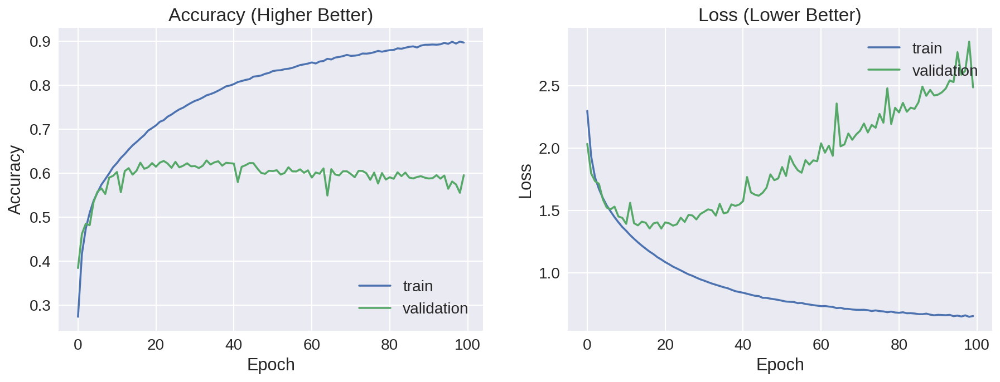

In [0]:
# Plots the accuracy/ loss curves for trained LeNet model with L1 regularization
plotAccuracyLoss(model_log_LeNet_L1)

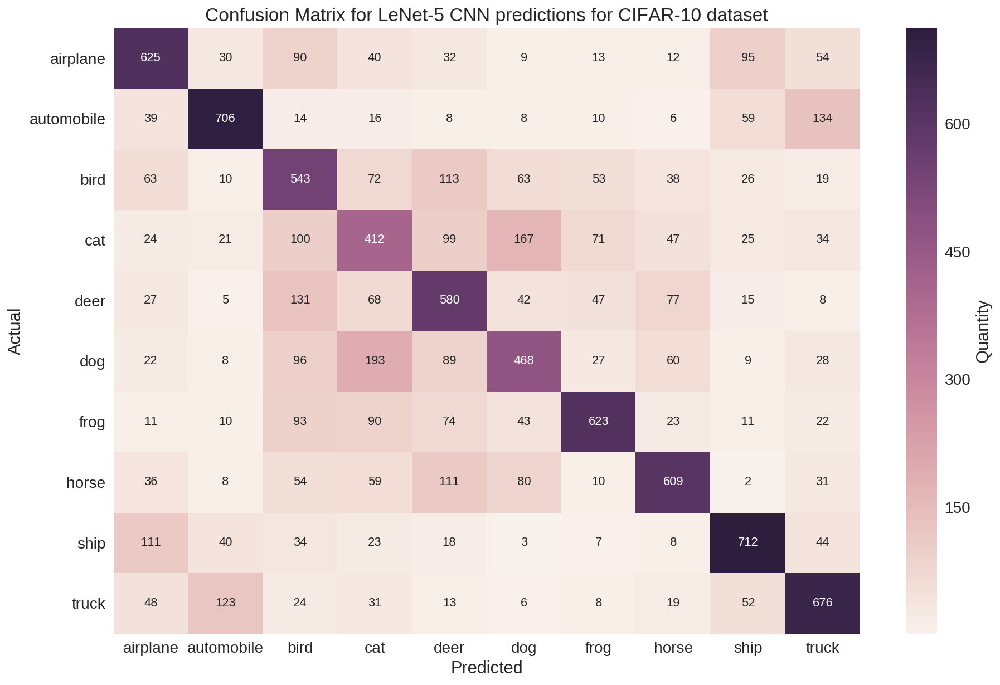

In [0]:
# Plots the confusion matrix for the trained LeNet model with L1 regularization
LeNet_L1_y_pred, LeNet_L1_y_test = plotConfusionMatrix("LeNet_L1", model_LeNet_L1, x_test, y_test)

In [0]:
# Prints the classification report based on predicted and actual test dataset labels 
# for the LeNet model with L1 regularization
plotClassificationReport(LeNet_L1_y_pred, LeNet_L1_y_test, names)

             precision    recall  f1-score   support

   airplane       0.62      0.62      0.62      1000
 automobile       0.73      0.71      0.72      1000
       bird       0.46      0.54      0.50      1000
        cat       0.41      0.41      0.41      1000
       deer       0.51      0.58      0.54      1000
        dog       0.53      0.47      0.50      1000
       frog       0.72      0.62      0.67      1000
      horse       0.68      0.61      0.64      1000
       ship       0.71      0.71      0.71      1000
      truck       0.64      0.68      0.66      1000

avg / total       0.60      0.60      0.60     10000



In [0]:
# Evaluates the accuracy and loss scores for the test dataset 
# using the trained LeNet model with L1 regularization
printTestStats(model_LeNet_L1, x_test, y_test)

Test loss: 2.4853762031555178
Test accuracy: 0.5954


[2.4853762031555178, 0.5954]

#### 5.1.3.2. LeNet (with L2 Regularization)

In [0]:
# Perform model training using base LeNet model with L2 regularization
model_LeNet_L2, model_log_LeNet_L2, model_LeNet_L2_TrainTime = TrainModel("LeNet_L2", x_train, y_train, x_test, y_test)


Epoch 00001: val_loss improved from inf to 1.70274, saving model to weights_01_1.70.h5

Epoch 00002: val_loss improved from 1.70274 to 1.51941, saving model to weights_02_1.52.h5

Epoch 00003: val_loss improved from 1.51941 to 1.42847, saving model to weights_03_1.43.h5

Epoch 00004: val_loss improved from 1.42847 to 1.37640, saving model to weights_04_1.38.h5

Epoch 00005: val_loss improved from 1.37640 to 1.35177, saving model to weights_05_1.35.h5

Epoch 00006: val_loss did not improve from 1.35177

Epoch 00007: val_loss improved from 1.35177 to 1.18672, saving model to weights_07_1.19.h5

Epoch 00008: val_loss improved from 1.18672 to 1.17223, saving model to weights_08_1.17.h5

Epoch 00009: val_loss improved from 1.17223 to 1.14134, saving model to weights_09_1.14.h5

Epoch 00010: val_loss did not improve from 1.14134

Epoch 00011: val_loss improved from 1.14134 to 1.11140, saving model to weights_11_1.11.h5

Epoch 00012: val_loss improved from 1.11140 to 1.10684, saving model to

In [0]:
# Save trained LeNet model with L2 regularization to disk
model_LeNet_L2.save('model_LeNet_L2.h5')

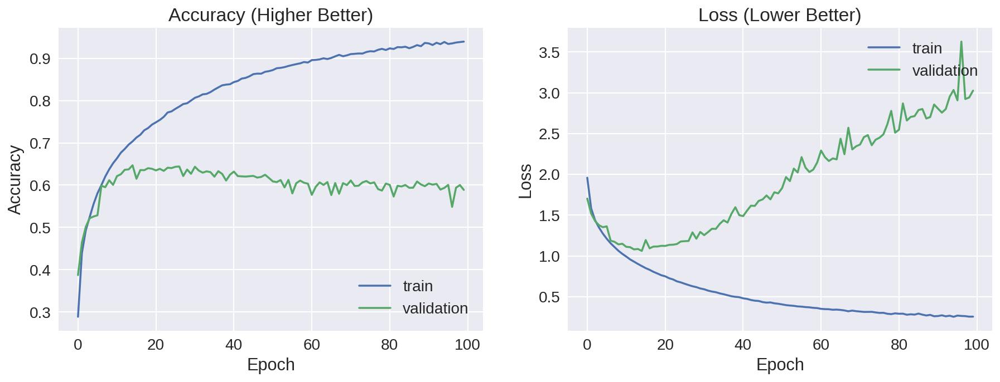

In [0]:
# Plots the accuracy/ loss curves for trained LeNet model with L2 regularization
plotAccuracyLoss(model_log_LeNet_L2)

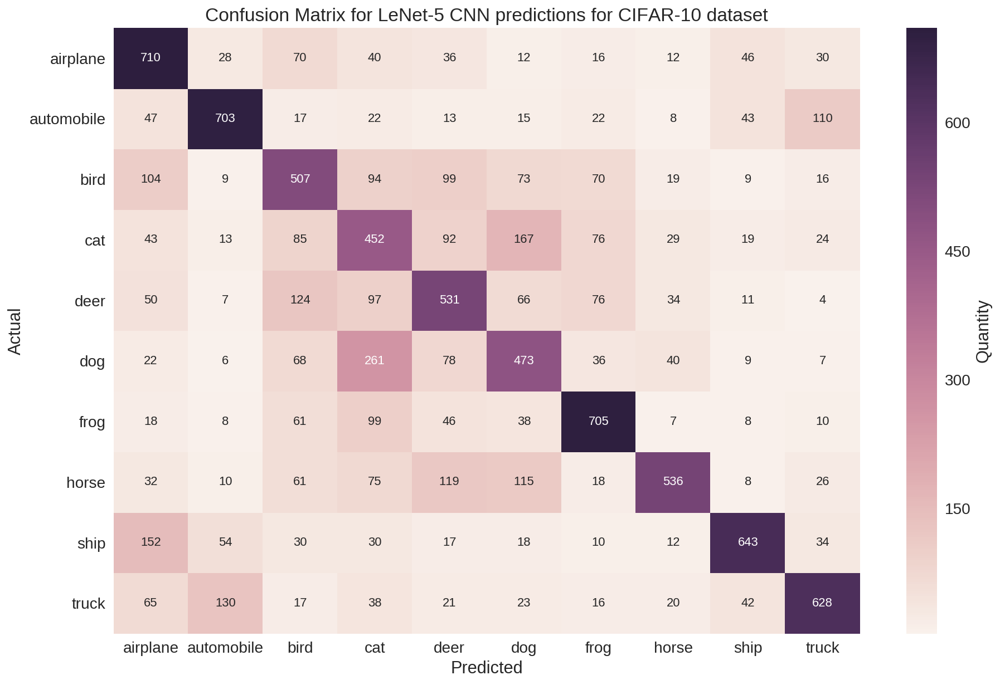

In [0]:
# Plots the confusion matrix for the trained LeNet model with L2 regularization
LeNet_L2_y_pred, LeNet_L2_y_test = plotConfusionMatrix("LeNet_L2", model_LeNet_L2, x_test, y_test)

In [0]:
# Prints the classification report based on predicted and actual test dataset labels 
# for the LeNet model with L2 regularization
plotClassificationReport(LeNet_L2_y_pred, LeNet_L2_y_test, names)

             precision    recall  f1-score   support

   airplane       0.57      0.71      0.63      1000
 automobile       0.73      0.70      0.71      1000
       bird       0.49      0.51      0.50      1000
        cat       0.37      0.45      0.41      1000
       deer       0.50      0.53      0.52      1000
        dog       0.47      0.47      0.47      1000
       frog       0.67      0.70      0.69      1000
      horse       0.75      0.54      0.62      1000
       ship       0.77      0.64      0.70      1000
      truck       0.71      0.63      0.66      1000

avg / total       0.60      0.59      0.59     10000



In [0]:
# Evaluates the accuracy and loss scores for the test dataset 
# using the trained LeNet model with L2 regularization
printTestStats(model_LeNet_L2, x_test, y_test)

Test loss: 3.0266742586135864
Test accuracy: 0.5888


[3.0266742586135864, 0.5888]

### 5.1.4. LeNet (with Data Augmentation)

In [0]:
# Perform model training using LeNet model with data augmentation
model_LeNet_DataAugmentation, model_log_LeNet_DataAugmentation = TrainAugmentedModel("LeNet_DataAugmentation", x_train, y_train, x_test, y_test)

Epoch 1/100
1563/1562 [==============================] - 59s 38ms/step - loss: 1.9958 - acc: 0.2694 - val_loss: 1.7835 - val_acc: 0.3517

Epoch 00001: val_loss improved from inf to 1.78349, saving model to weights_01_1.78.h5
Epoch 2/100
1563/1562 [==============================] - 58s 37ms/step - loss: 1.6537 - acc: 0.4011 - val_loss: 1.5640 - val_acc: 0.4276

Epoch 00002: val_loss improved from 1.78349 to 1.56397, saving model to weights_02_1.56.h5
Epoch 3/100
1563/1562 [==============================] - 59s 37ms/step - loss: 1.5357 - acc: 0.4473 - val_loss: 1.5637 - val_acc: 0.4361

Epoch 00003: val_loss improved from 1.56397 to 1.56367, saving model to weights_03_1.56.h5
Epoch 4/100
1563/1562 [==============================] - 58s 37ms/step - loss: 1.4642 - acc: 0.4742 - val_loss: 1.4495 - val_acc: 0.4815

Epoch 00004: val_loss improved from 1.56367 to 1.44953, saving model to weights_04_1.45.h5
Epoch 5/100
1563/1562 [==============================] - 59s 37ms/step - loss: 1.4086 - 

In [0]:
# Save trained LeNet model with data augmentation to disk
model_LeNet_DataAugmentation.save('model_LeNet_DataAugmentation.h5')

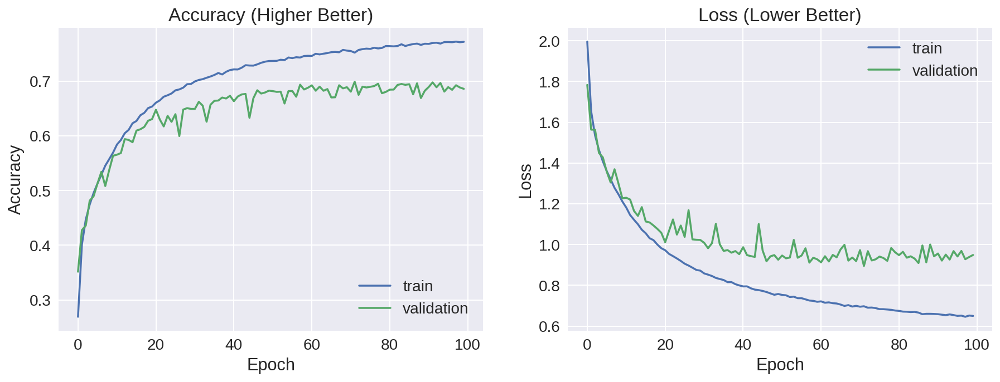

In [0]:
# Plots the accuracy/ loss curves for trained LeNet model with data augmentation
plotAccuracyLoss(model_log_LeNet_DataAugmentation)

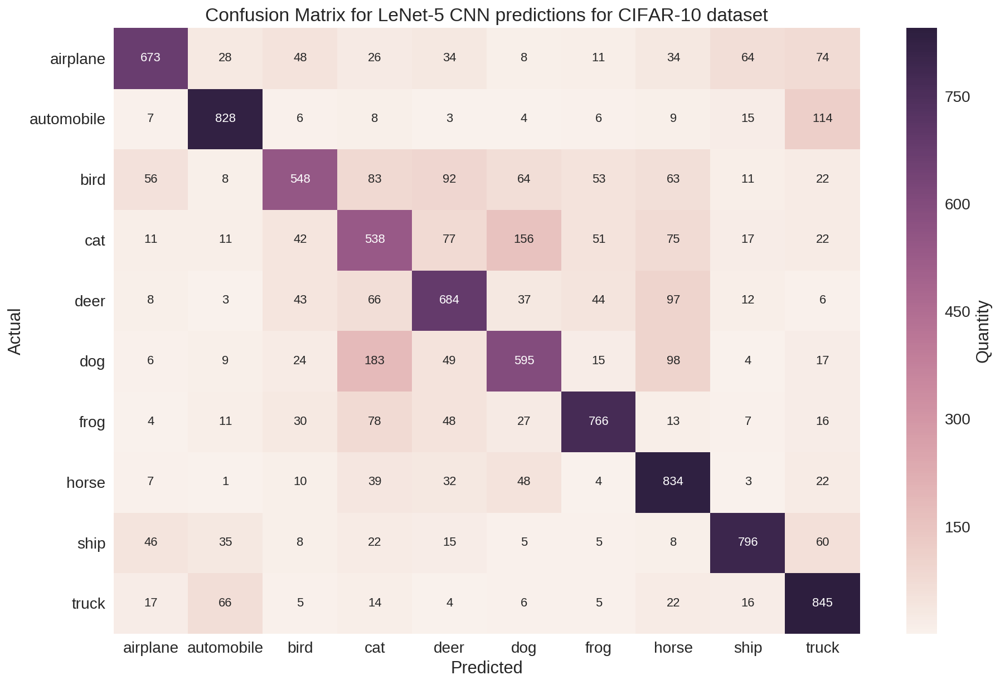

In [0]:
# Plots the confusion matrix for the trained LeNet model with data augmentation
LeNet_DataAugmentation_y_pred, LeNet_DataAugmentation_y_test = plotConfusionMatrix("LeNet_DataAaugmentation", model_LeNet_DataAugmentation, x_test, y_test)

In [0]:
# Prints the classification report based on predicted and actual test dataset labels 
# for the LeNet model with data augmentation
plotClassificationReport(LeNet_DataAugmentation_y_pred, LeNet_DataAugmentation_y_test, names)

             precision    recall  f1-score   support

   airplane       0.81      0.67      0.73      1000
 automobile       0.83      0.83      0.83      1000
       bird       0.72      0.55      0.62      1000
        cat       0.51      0.54      0.52      1000
       deer       0.66      0.68      0.67      1000
        dog       0.63      0.59      0.61      1000
       frog       0.80      0.77      0.78      1000
      horse       0.67      0.83      0.74      1000
       ship       0.84      0.80      0.82      1000
      truck       0.71      0.84      0.77      1000

avg / total       0.72      0.71      0.71     10000



In [0]:
# Evaluates the accuracy and loss scores for the test dataset 
# using the trained LeNet model with data augmentation
printTestStats(model_LeNet_DataAugmentation, x_test, y_test)

Test loss: 0.8863858350753784
Test accuracy: 0.7107


[0.8863858350753784, 0.7107]

### 5.1.5. LeNet (with Early Stopping)

In [0]:
# Perform model training using LeNet model with early stopping
model_LeNet_EarlyStopping, model_log_LeNet_EarlyStopping, model_LeNet_EarlyStopping_TrainTime = TrainModel("LeNet", x_train, y_train, x_test, y_test, useEarlyStopping=True)


Epoch 00001: val_loss improved from inf to 1.67081, saving model to weights_01_1.67.h5

Epoch 00002: val_loss improved from 1.67081 to 1.43794, saving model to weights_02_1.44.h5

Epoch 00003: val_loss improved from 1.43794 to 1.36710, saving model to weights_03_1.37.h5

Epoch 00004: val_loss improved from 1.36710 to 1.30443, saving model to weights_04_1.30.h5

Epoch 00005: val_loss improved from 1.30443 to 1.21777, saving model to weights_05_1.22.h5

Epoch 00006: val_loss did not improve from 1.21777

Epoch 00007: val_loss improved from 1.21777 to 1.19222, saving model to weights_07_1.19.h5

Epoch 00008: val_loss improved from 1.19222 to 1.09827, saving model to weights_08_1.10.h5

Epoch 00009: val_loss improved from 1.09827 to 1.07690, saving model to weights_09_1.08.h5

Epoch 00010: val_loss did not improve from 1.07690

Epoch 00011: val_loss did not improve from 1.07690

Epoch 00012: val_loss improved from 1.07690 to 1.04267, saving model to weights_12_1.04.h5

Epoch 00013: val_lo

In [0]:
# Save trained LeNet model with early stopping to disk
model_LeNet_EarlyStopping.save('model_LeNet_EarlyStopping.h5')

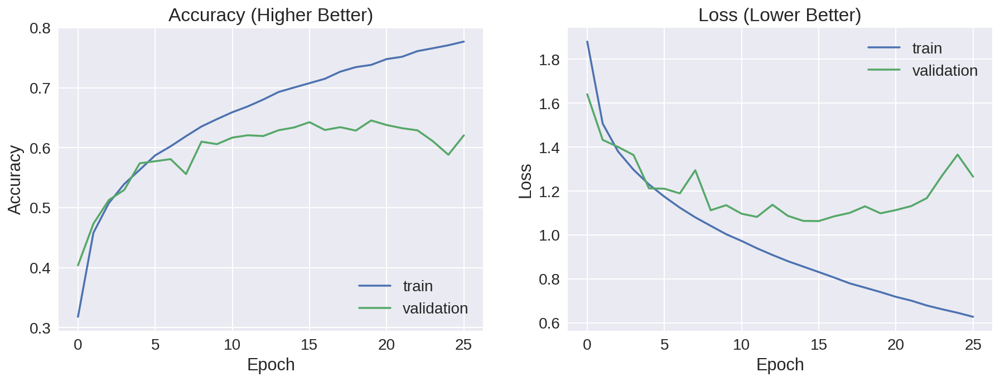

In [0]:
# Plots the accuracy/ loss curves for trained LeNet model with early stopping
plotAccuracyLoss(model_log_LeNet_EarlyStopping)

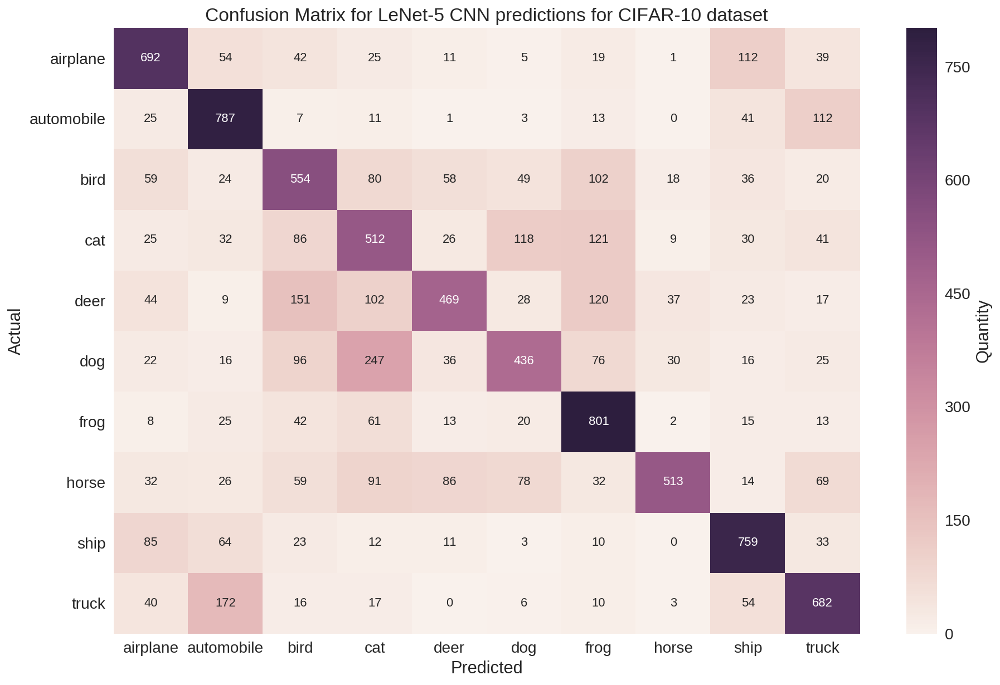

In [0]:
# Plots the confusion matrix for the trained LeNet model with early stopping
LeNet_EarlyStopping_y_pred, LeNet_EarlyStopping_y_test = plotConfusionMatrix("LeNet_EarlyStopping", model_LeNet_EarlyStopping, x_test, y_test)

In [0]:
# Prints the classification report based on predicted and actual test dataset labels 
# for the LeNet model with early stopping
plotClassificationReport(LeNet_EarlyStopping_y_pred, LeNet_EarlyStopping_y_test, names)

             precision    recall  f1-score   support

   airplane       0.67      0.69      0.68      1000
 automobile       0.65      0.79      0.71      1000
       bird       0.51      0.55      0.53      1000
        cat       0.44      0.51      0.47      1000
       deer       0.66      0.47      0.55      1000
        dog       0.58      0.44      0.50      1000
       frog       0.61      0.80      0.70      1000
      horse       0.84      0.51      0.64      1000
       ship       0.69      0.76      0.72      1000
      truck       0.65      0.68      0.67      1000

avg / total       0.63      0.62      0.62     10000



In [0]:
# Evaluates the accuracy and loss scores for the test dataset 
# using the trained LeNet model with early stopping
printTestStats(model_LeNet_EarlyStopping, x_test, y_test)

Test loss: 1.26560675201416
Test accuracy: 0.6205


[1.26560675201416, 0.6205]

### 5.1.6. LeNet (with mixed regularization)

In [0]:
# Perform model training using LeNet model with mixed regularization (Dropout/ Early Stopping/ L1 Regularization) 
model_LeNet_Mixed, model_log_LeNet_Mixed = TrainAugmentedModel("LeNet_Mixed", x_train, y_train, x_test, y_test, dropout=0.2, kernel_regularizer=regularizers.l1(0.0001), useEarlyStopping=False)

Epoch 1/100
1563/1562 [==============================] - 62s 40ms/step - loss: 2.4066 - acc: 0.2197 - val_loss: 2.2047 - val_acc: 0.3225

Epoch 00001: val_loss improved from inf to 2.20470, saving model to weights_01_2.20.h5
Epoch 2/100
1563/1562 [==============================] - 61s 39ms/step - loss: 2.1583 - acc: 0.3178 - val_loss: 2.0734 - val_acc: 0.3665

Epoch 00002: val_loss improved from 2.20470 to 2.07342, saving model to weights_02_2.07.h5
Epoch 3/100
1563/1562 [==============================] - 61s 39ms/step - loss: 1.9991 - acc: 0.3761 - val_loss: 1.8521 - val_acc: 0.4340

Epoch 00003: val_loss improved from 2.07342 to 1.85208, saving model to weights_03_1.85.h5
Epoch 4/100
1563/1562 [==============================] - 61s 39ms/step - loss: 1.8929 - acc: 0.4131 - val_loss: 1.7840 - val_acc: 0.4481

Epoch 00004: val_loss improved from 1.85208 to 1.78401, saving model to weights_04_1.78.h5
Epoch 5/100
1563/1562 [==============================] - 61s 39ms/step - loss: 1.8247 - 

In [0]:
# Save trained LeNet model with mixed regularization (Dropout/ Early Stopping/ L1 Regularization) to disk
model_LeNet_Mixed.save('model_LeNet_Mixed.h5')

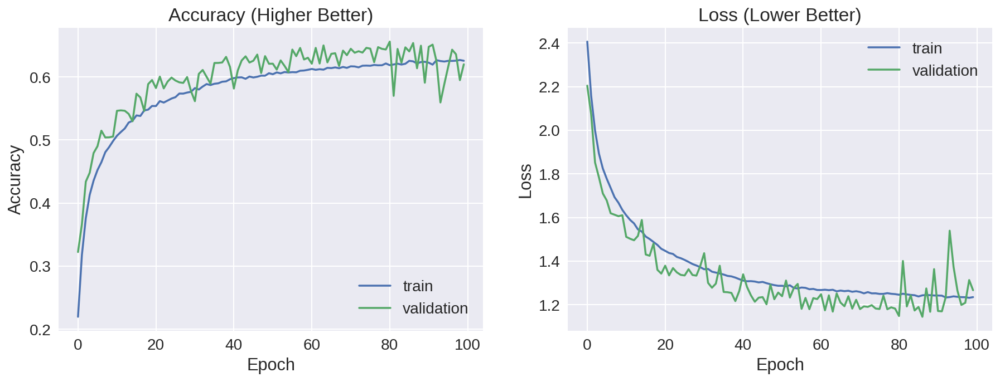

In [0]:
# Plots the accuracy/ loss curves for trained LeNet model with mixed regularization 
# (Dropout/ Early Stopping/ L1 Regularization) to disk
plotAccuracyLoss(model_log_LeNet_Mixed)

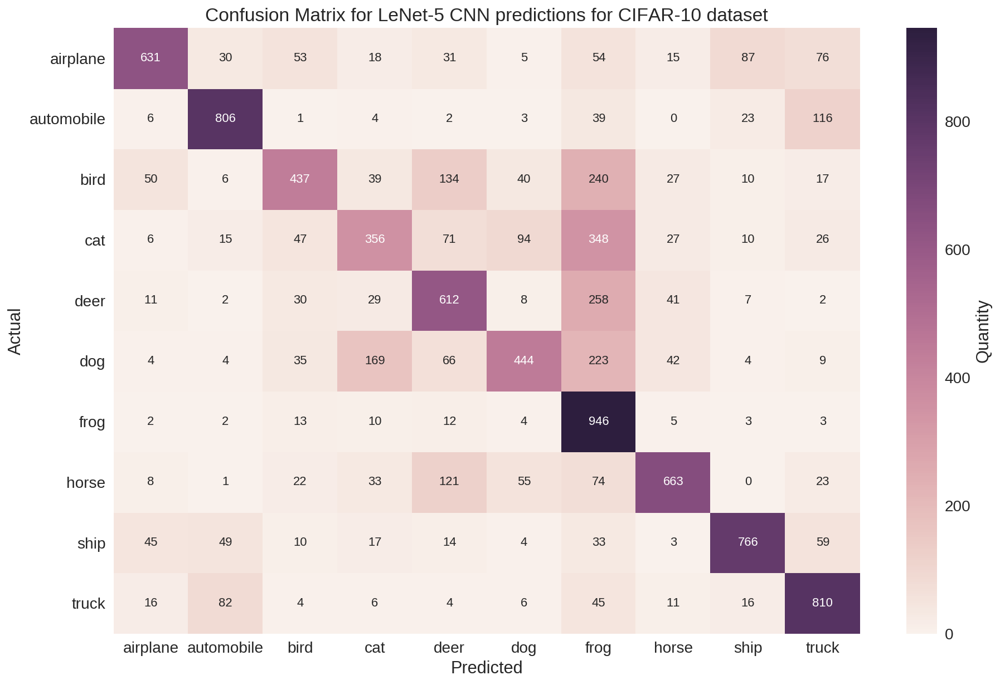

In [0]:
# Plots the confusion matrix for the trained LeNet model with mixed regularization 
# (Dropout/ Early Stopping/ L1 Regularization) 
LeNet_Mixed_y_pred, LeNet_Mixed_y_test = plotConfusionMatrix("LeNet_Mixed", model_LeNet_Mixed, x_test, y_test)

In [0]:
# Prints the classification report based on predicted and actual test dataset labels for the LeNet model
# with mixed regularization (Dropout/ Early Stopping/ L1 Regularization) 
plotClassificationReport(LeNet_Mixed_y_pred, LeNet_Mixed_y_test, names)

             precision    recall  f1-score   support

   airplane       0.81      0.63      0.71      1000
 automobile       0.81      0.81      0.81      1000
       bird       0.67      0.44      0.53      1000
        cat       0.52      0.36      0.42      1000
       deer       0.57      0.61      0.59      1000
        dog       0.67      0.44      0.53      1000
       frog       0.42      0.95      0.58      1000
      horse       0.79      0.66      0.72      1000
       ship       0.83      0.77      0.80      1000
      truck       0.71      0.81      0.76      1000

avg / total       0.68      0.65      0.65     10000



In [0]:
# Evaluates the accuracy and loss scores for the test dataset using the trained LeNet model
# with mixed regularization (Dropout/ Early Stopping/ L1 Regularization) 
printTestStats(model_LeNet_Mixed, x_test, y_test)

Test loss: 1.2028385154724122
Test accuracy: 0.6471


[1.2028385154724122, 0.6471]

### 5.1.7. LeNet (with Batch Normalization)

In [0]:
# Perform model training using LeNet model with Batch Normalization
model_LeNet_BN, model_log_LeNet_BN, model_LeNet_BN_TrainTime = TrainModel("LeNet_BN", x_train, y_train, x_test, y_test)


Epoch 00001: val_loss improved from inf to 1.78770, saving model to weights_01_1.79.h5

Epoch 00002: val_loss improved from 1.78770 to 1.24365, saving model to weights_02_1.24.h5

Epoch 00003: val_loss did not improve from 1.24365

Epoch 00004: val_loss did not improve from 1.24365

Epoch 00005: val_loss did not improve from 1.24365

Epoch 00006: val_loss improved from 1.24365 to 1.12219, saving model to weights_06_1.12.h5

Epoch 00007: val_loss did not improve from 1.12219

Epoch 00008: val_loss did not improve from 1.12219

Epoch 00009: val_loss improved from 1.12219 to 1.09548, saving model to weights_09_1.10.h5

Epoch 00010: val_loss did not improve from 1.09548

Epoch 00011: val_loss did not improve from 1.09548

Epoch 00012: val_loss improved from 1.09548 to 1.05644, saving model to weights_12_1.06.h5

Epoch 00013: val_loss did not improve from 1.05644

Epoch 00014: val_loss did not improve from 1.05644

Epoch 00015: val_loss improved from 1.05644 to 1.05305, saving model to wei

In [0]:
# Save trained LeNet model with Batch Normalization to disk
model_LeNet_BN.save('model_LeNet_BN.h5')

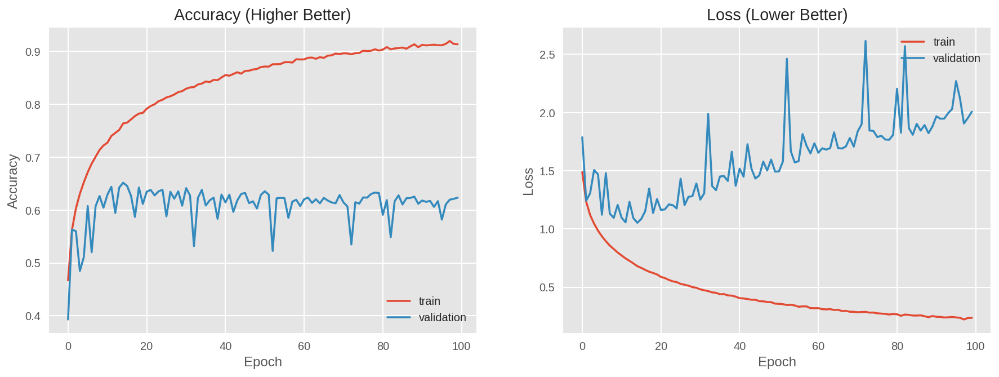

In [0]:
# Plots the accuracy/ loss curves for trained LeNet model with Batch Normalization
plotAccuracyLoss(model_log_LeNet_BN)

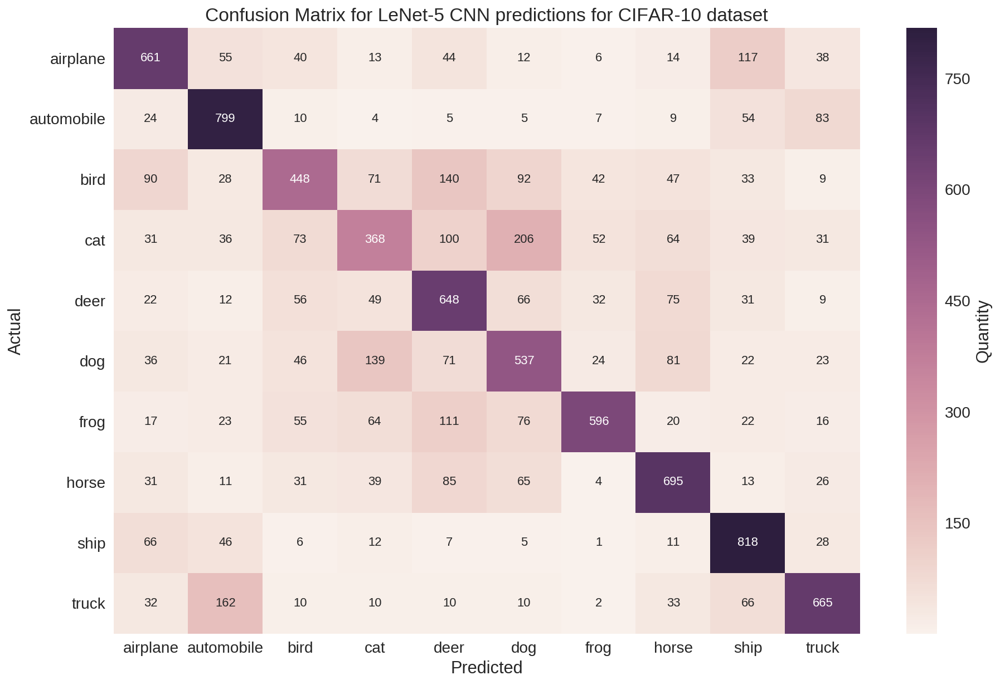

In [0]:
# Plots the confusion matrix for the trained LeNet model with Batch Normalization
LeNet_BN_y_pred, LeNet_BN_y_test = plotConfusionMatrix("LeNet_BN", model_LeNet_BN, x_test, y_test)

In [0]:
# Prints the classification report based on predicted and actual test dataset labels for the LeNet model
# with Batvh Normalization
plotClassificationReport(LeNet_BN_y_pred, LeNet_BN_y_test, names)

             precision    recall  f1-score   support

   airplane       0.65      0.66      0.66      1000
 automobile       0.67      0.80      0.73      1000
       bird       0.58      0.45      0.50      1000
        cat       0.48      0.37      0.42      1000
       deer       0.53      0.65      0.58      1000
        dog       0.50      0.54      0.52      1000
       frog       0.78      0.60      0.67      1000
      horse       0.66      0.69      0.68      1000
       ship       0.67      0.82      0.74      1000
      truck       0.72      0.67      0.69      1000

avg / total       0.62      0.62      0.62     10000



In [0]:
# Evaluates the accuracy and loss scores for the test dataset using the trained LeNet model
# with Batch Normalization
printTestStats(model_LeNet_BN, x_test, y_test)

Test loss: 2.0071912066459654
Test accuracy: 0.6235


[2.0071912066459654, 0.6235]

### 5.1.8. LeNet (with mixed regularization/ Batch Normalization)

In [0]:
# Perform model training using LeNet model with mixed Regularization/ Batch Normalization
model_LeNet_Mixed_BN, model_log_LeNet_Mixed_BN = TrainAugmentedModel("LeNet_Mixed_BN", x_train, y_train, x_test, y_test, dropout=0.2, 
                                                               kernel_regularizer=regularizers.l1(0.0001), 
                                                               useEarlyStopping=False,
                                                               batch_normalization=True)

Epoch 1/100
1563/1562 [==============================] - 71s 45ms/step - loss: 2.1850 - acc: 0.3328 - val_loss: 1.8950 - val_acc: 0.4302

Epoch 00001: val_loss improved from inf to 1.89505, saving model to weights_01_1.90.h5
Epoch 2/100
1563/1562 [==============================] - 69s 44ms/step - loss: 1.9071 - acc: 0.4155 - val_loss: 2.5647 - val_acc: 0.2918

Epoch 00002: val_loss did not improve from 1.89505
Epoch 3/100
1563/1562 [==============================] - 69s 44ms/step - loss: 1.8150 - acc: 0.4476 - val_loss: 1.8137 - val_acc: 0.4522

Epoch 00003: val_loss improved from 1.89505 to 1.81368, saving model to weights_03_1.81.h5
Epoch 4/100
1563/1562 [==============================] - 68s 44ms/step - loss: 1.7528 - acc: 0.4710 - val_loss: 1.8960 - val_acc: 0.4150

Epoch 00004: val_loss did not improve from 1.81368
Epoch 5/100
1563/1562 [==============================] - 94s 60ms/step - loss: 1.7012 - acc: 0.4870 - val_loss: 1.5523 - val_acc: 0.5396

Epoch 00005: val_loss improved

KeyboardInterrupt: ignored

In [0]:
# Save trained LeNet model with mixed Regularization/ Batch Normalization to disk
model_LeNet_Mixed_BN.save('model_LeNet_Mixed_BN.h5')

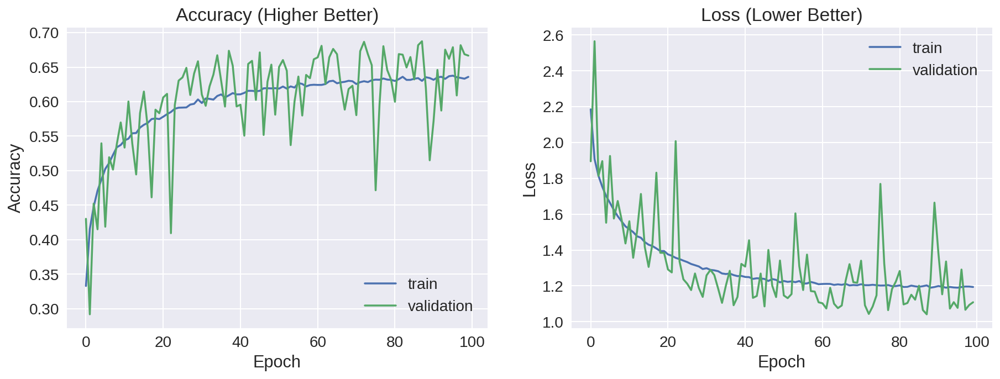

In [0]:
# Plots the accuracy/ loss curves for trained LeNet model with mixed Regularization/ Batch Normalization
plotAccuracyLoss(model_log_LeNet_Mixed_BN)

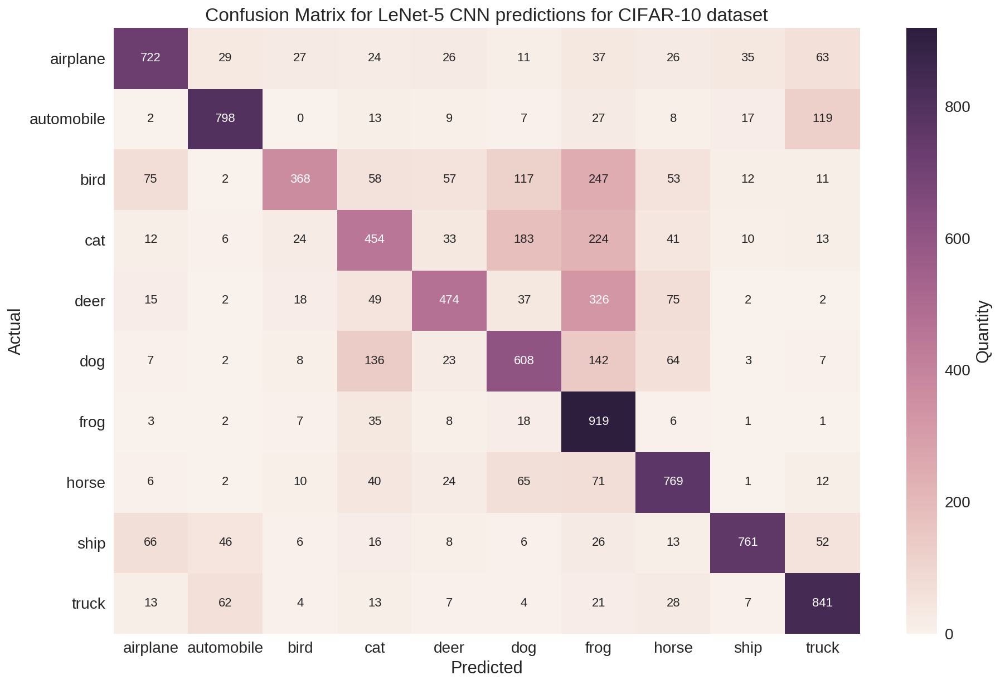

In [0]:
# Plots the confusion matrix for the trained LeNet model with mixed Regularization/ Batch Normalization 
LeNet_Mixed_BN_y_pred, LeNet_Mixed_BN_y_test = plotConfusionMatrix("LeNet_Mixed_BN", model_LeNet_Mixed_BN, x_test, y_test)

In [0]:
# Prints the classification report based on predicted and actual test dataset labels for the LeNet model
# with mixed Regularization/ Batch Normalization
plotClassificationReport(LeNet_Mixed_BN_y_pred, LeNet_Mixed_BN_y_test, names)

             precision    recall  f1-score   support

   airplane       0.78      0.72      0.75      1000
 automobile       0.84      0.80      0.82      1000
       bird       0.78      0.37      0.50      1000
        cat       0.54      0.45      0.49      1000
       deer       0.71      0.47      0.57      1000
        dog       0.58      0.61      0.59      1000
       frog       0.45      0.92      0.60      1000
      horse       0.71      0.77      0.74      1000
       ship       0.90      0.76      0.82      1000
      truck       0.75      0.84      0.79      1000

avg / total       0.70      0.67      0.67     10000



In [0]:
# Evaluates the accuracy and loss scores for the test dataset using the trained LeNet model
# with mixed Regularization/ Batch Normalization
printTestStats(model_LeNet_Mixed_BN, x_test, y_test)

Test loss: 1.0838607692718505
Test accuracy: 0.6714


[1.0838607692718505, 0.6714]

### 5.1.9. Performance Comparison of base/ regularized models

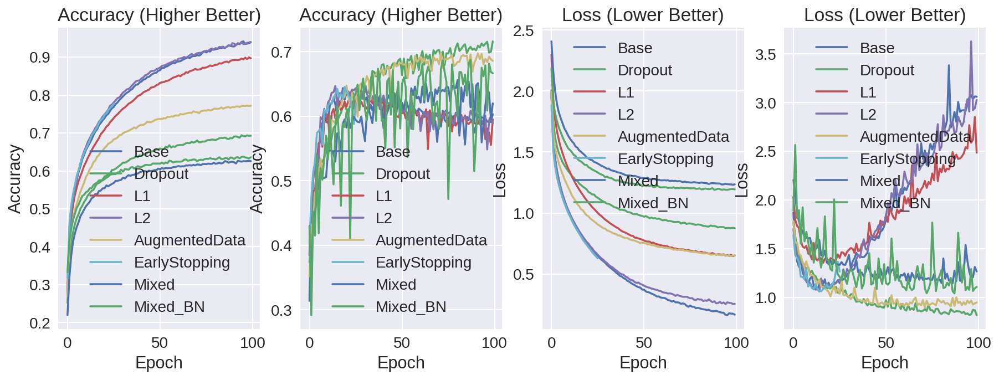

In [0]:
# Compares the accuracy/loss curves of the trained models for both train and test datasets
model_logs = {"Base":model_log_LeNet, "Dropout":model_log_LeNet_Dropout, "L1":model_log_LeNet_L1, "L2":model_log_LeNet_L2,
              "AugmentedData":model_log_LeNet_DataAugmentation, "EarlyStopping":model_log_LeNet_EarlyStopping, 
              "Mixed":model_log_LeNet_Mixed, "Mixed_BN":model_log_LeNet_Mixed_BN}
#model_logs = {"Base":model_log_LeNet, "Dropout":model_log_LeNet_Dropout, "L1":model_log_LeNet_L1, "L2":model_log_LeNet_L2}
plotAccuracyLossComparison(model_logs)

## 5.2. AlexNet

In [0]:
# Perform model training using AlexNet model
model_AlexNet, model_log_AlexNet, model_AlexNet_TrainTime = TrainModel("AlexNet", x_train, y_train, x_test, y_test)


Epoch 00001: val_loss improved from inf to 2.85523, saving model to weights_01_2.86.h5

Epoch 00002: val_loss did not improve from 2.85523

Epoch 00003: val_loss improved from 2.85523 to 1.43160, saving model to weights_03_1.43.h5

Epoch 00004: val_loss did not improve from 1.43160

Epoch 00005: val_loss did not improve from 1.43160

Epoch 00006: val_loss did not improve from 1.43160

Epoch 00007: val_loss improved from 1.43160 to 1.12390, saving model to weights_07_1.12.h5

Epoch 00008: val_loss did not improve from 1.12390

Epoch 00009: val_loss did not improve from 1.12390

Epoch 00010: val_loss did not improve from 1.12390

Epoch 00011: val_loss did not improve from 1.12390

Epoch 00012: val_loss did not improve from 1.12390

Epoch 00013: val_loss did not improve from 1.12390

Epoch 00014: val_loss did not improve from 1.12390

Epoch 00015: val_loss did not improve from 1.12390

Epoch 00016: val_loss did not improve from 1.12390

Epoch 00017: val_loss did not improve from 1.12390


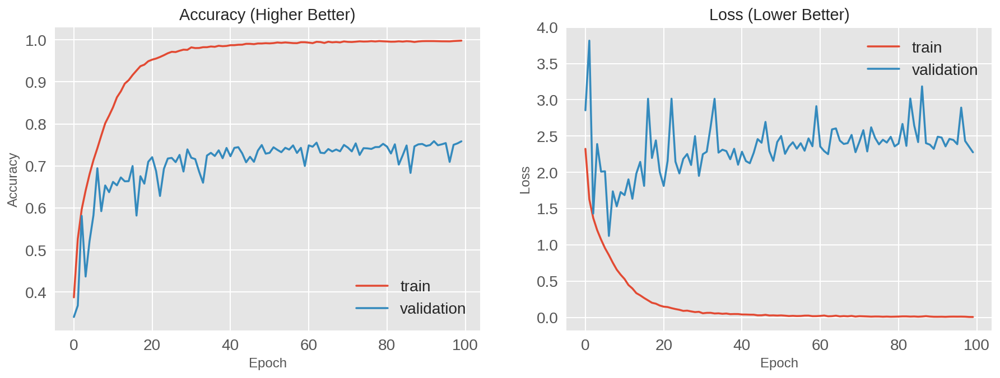

In [0]:
# Plots the accuracy/ loss curves for trained AlexNet model
plotAccuracyLoss(model_log_AlexNet)

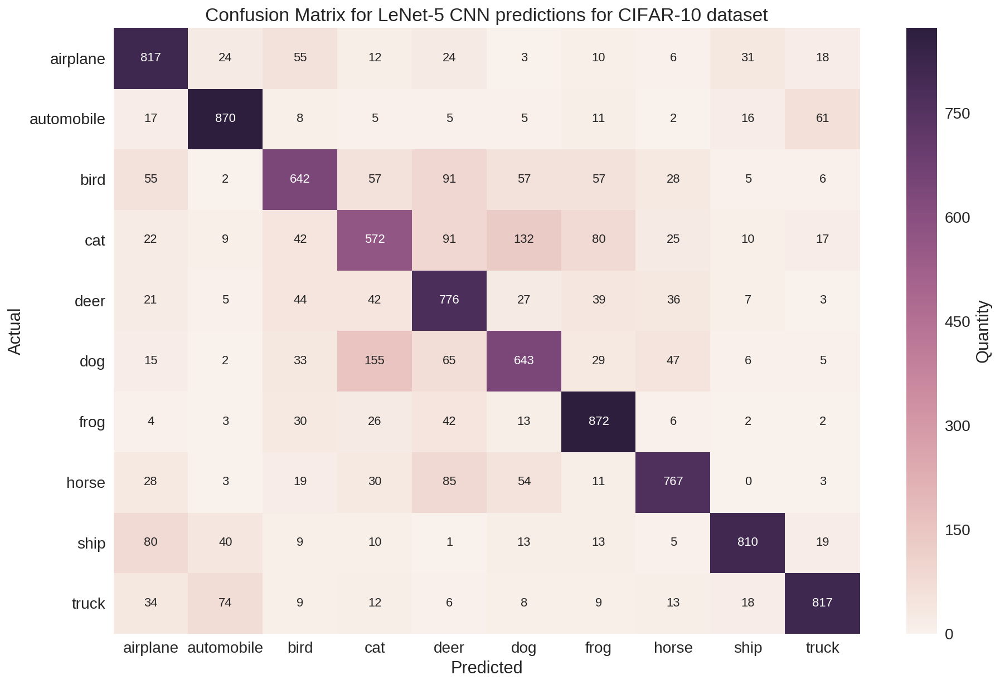

In [0]:
# Plots the confusion matrix for the trained AlexNet model
AlexNet_y_pred, AlexNet_y_test = plotConfusionMatrix("AlexNet", model_AlexNet, x_test, y_test)

In [0]:
# Prints the classification report based on predicted and actual test dataset labels for the AlexNet model
plotClassificationReport(AlexNet_y_pred, AlexNet_y_test, names)

             precision    recall  f1-score   support

   airplane       0.75      0.82      0.78      1000
 automobile       0.84      0.87      0.86      1000
       bird       0.72      0.64      0.68      1000
        cat       0.62      0.57      0.60      1000
       deer       0.65      0.78      0.71      1000
        dog       0.67      0.64      0.66      1000
       frog       0.77      0.87      0.82      1000
      horse       0.82      0.77      0.79      1000
       ship       0.90      0.81      0.85      1000
      truck       0.86      0.82      0.84      1000

avg / total       0.76      0.76      0.76     10000



In [0]:
# Evaluates the accuracy and loss scores for the test dataset using the trained AlexNet model
printTestStats(model_AlexNet, x_test, y_test)

Test loss: 2.2762546327590942
Test accuracy: 0.7586


[2.2762546327590942, 0.7586]

## 5.4. VGG-16

In [0]:
# Perform model training using VGG-16 model
model_VGGNet, model_log_VGGNet = TrainModel("VGGNet", x_train, y_train, x_test, y_test)


Epoch 00001: val_loss improved from inf to 1.90297, saving model to weights_01_1.90.h5

Epoch 00002: val_loss did not improve from 1.90297

Epoch 00003: val_loss improved from 1.90297 to 1.32512, saving model to weights_03_1.33.h5

Epoch 00004: val_loss improved from 1.32512 to 0.89691, saving model to weights_04_0.90.h5

Epoch 00005: val_loss did not improve from 0.89691

Epoch 00006: val_loss improved from 0.89691 to 0.85448, saving model to weights_06_0.85.h5

Epoch 00007: val_loss did not improve from 0.85448

Epoch 00008: val_loss improved from 0.85448 to 0.79845, saving model to weights_08_0.80.h5

Epoch 00009: val_loss did not improve from 0.79845

Epoch 00010: val_loss did not improve from 0.79845

Epoch 00011: val_loss did not improve from 0.79845

Epoch 00012: val_loss did not improve from 0.79845

Epoch 00013: val_loss did not improve from 0.79845

Epoch 00014: val_loss did not improve from 0.79845

Epoch 00015: val_loss did not improve from 0.79845

Epoch 00016: val_loss d

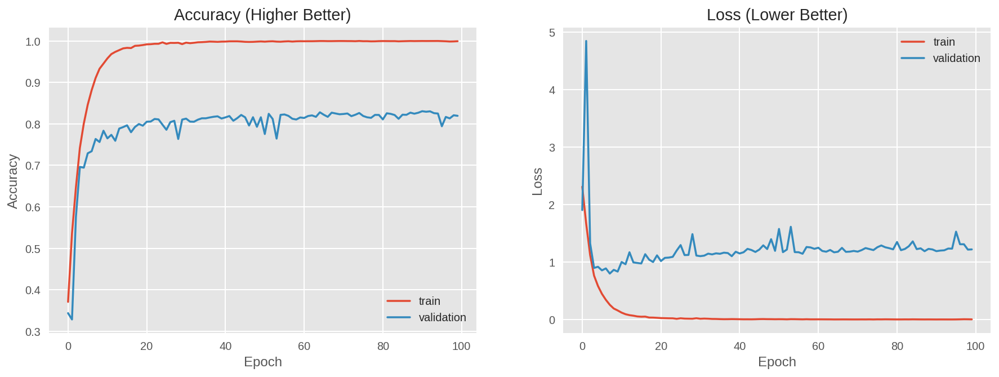

In [0]:
# Plots the accuracy/ loss curves for trained VGG-16 model
plotAccuracyLoss(model_log_VGGNet)

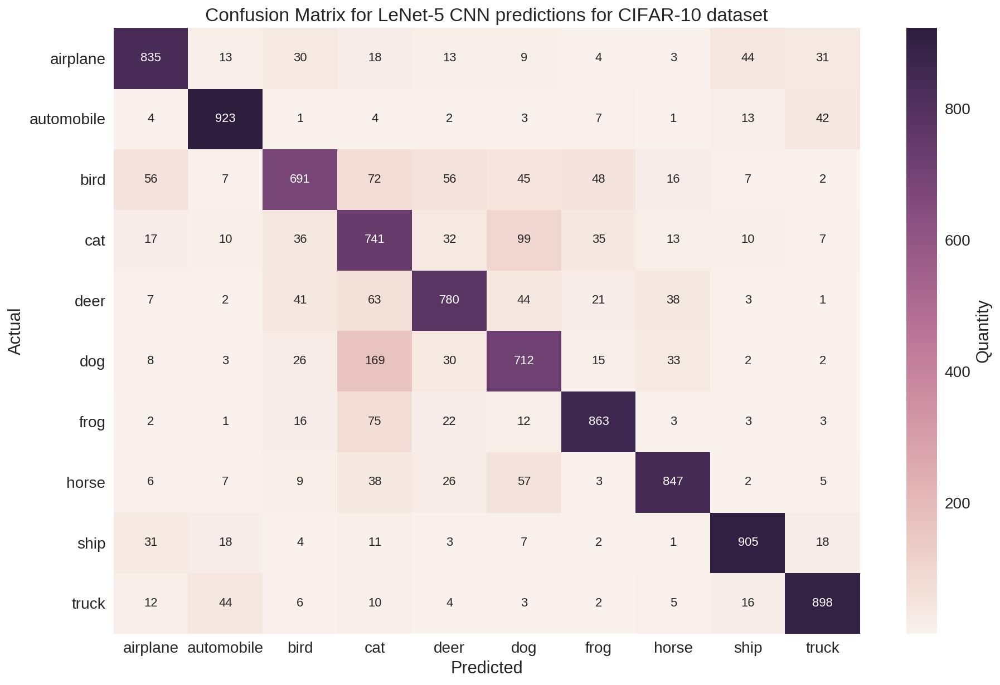

In [0]:
# Plots the confusion matrix for the trained VGG-16 model
VGGNet_y_pred, VGGNet_y_test = plotConfusionMatrix("VGGNet", model_VGGNet, x_test, y_test)

In [0]:
# Prints the classification report based on predicted and actual test dataset labels for the VGG-16 model
plotClassificationReport(VGGNet_y_pred, VGGNet_y_test, names)

             precision    recall  f1-score   support

   airplane       0.85      0.83      0.84      1000
 automobile       0.90      0.92      0.91      1000
       bird       0.80      0.69      0.74      1000
        cat       0.62      0.74      0.67      1000
       deer       0.81      0.78      0.79      1000
        dog       0.72      0.71      0.72      1000
       frog       0.86      0.86      0.86      1000
      horse       0.88      0.85      0.86      1000
       ship       0.90      0.91      0.90      1000
      truck       0.89      0.90      0.89      1000

avg / total       0.82      0.82      0.82     10000



In [0]:
# Evaluates the accuracy and loss scores for the test dataset using the trained VGG-16 model
printTestStats(model_VGGNet, x_test, y_test)

Test loss: 1.2190422409057617
Test accuracy: 0.8195


[1.2190422409057617, 0.8195]

# 6. Visualizing the wrongly classified data

## 6.1. Helper Functions

In [0]:
# Helper function for plotting misclassified images
def PlotMisclassifications(actual, predicted, model, x_test, y_test):  
  names_map = {'airplane':0,
          'automobile':1,
          'bird':2,
          'cat':3,
          'deer':4,
          'dog':5,
          'frog':6,
          'horse':7,
          'ship':8,
          'truck':9}

  # Get list of predicted classes for x_test by the LeNet model
  y_pred = model.predict_classes(x_test).tolist()

  # Get list of ground truth labels for x_test
  labels = np.argmax(y_test,axis=-1)

  # Get indices of actual in y_test
  labels_cat = np.where(labels == names_map[actual])

  plt.rcParams["figure.figsize"] = (3,3)

  # Get list of indices of misclassified "actual" (as "predicted") by the LeNet model
  lst = []
  for x in labels_cat[0]:
    if(y_pred[x] == names_map[predicted]):
      lst.append(x)

  # print 10 images of cats that are predicted as dogs by the LeNet model
  for i in range(3):
    for j in range(3):
      plt.subplot2grid((3,3), (i,j))
      plt.axis('off')
      plt.imshow(x_test[lst[(i+1)*(j+1)]], cmap=plt.get_cmap('gray'), aspect='auto')
    plt.show()

## 6.2. Plot sample images of cats misclassified as dogs by the LeNet model

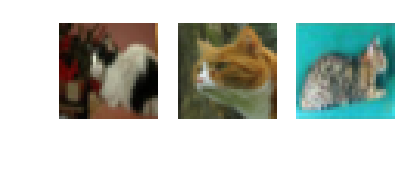

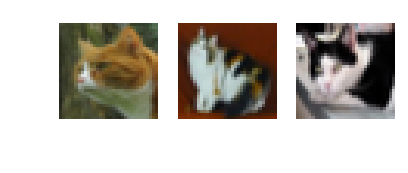

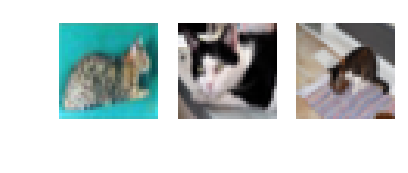

In [0]:
# Plots images of cats misclassified as dogs by the LeNet model
PlotMisclassifications("cat", "dog", model_LeNet, x_test, y_test)

## 6.3. Plot sample images of dogs misclassified as cats by the LeNet model

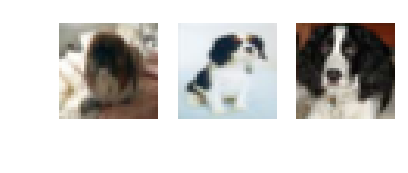

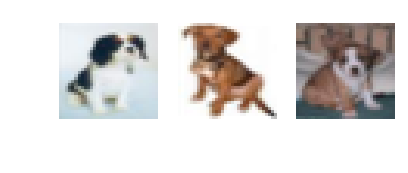

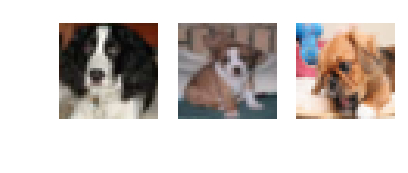

In [0]:
# Plots images of dogs misclassified as cats by the LeNet model
PlotMisclassifications("dog", "cat", model_LeNet, x_test, y_test)

# 7. LeNet Model Tuning


## 7.1. Model Tuning Helper Functions


In [0]:
# Helper function for performing hyperparameter tuning for specified parameters based on LeNet model
def TuneModel(param_name, param_list, batch_size=32, epochs=100, optimizer="SGD", init_mode="uniform", activation="relu", neurons=84):
  model_log_list = {}

  for param in param_list:
    (x_train, y_train), (x_test, y_test) = cifar10.load_data()

    x_train = x_train.reshape(x_train.shape[0], img_rows, img_cols, 3)
    x_test = x_test.reshape(x_test.shape[0], img_rows, img_cols, 3)
    input_shape = (img_rows, img_cols, 3)

    x_train = x_train.astype('float32')
    x_test = x_test.astype('float32')
    x_train /= 255
    x_test /= 255
    print('x_train shape:', x_train.shape)
    print(x_train.shape[0], 'train samples')
    print(x_test.shape[0], 'test samples')

    y_train = keras.utils.to_categorical(y_train, num_classes)
    y_test = keras.utils.to_categorical(y_test, num_classes)

    if(param_name == "batch_size"):
      model = createNN_LeNet()
      batch_size = param
    elif(param_name == "optimizer"):
      model = createNN_LeNet()
      optimizer = param
    elif(param_name == "init_mode"):
      model = createNN_LeNet(init_mode=param)
    elif(param_name == "activation"):
      model = createNN_LeNet(activation=param)
    elif(param_name == "neurons"):
      model = createNN_LeNet(neurons=param)
    elif(param_name == "learning_rate"):
      model = createNN_LeNet()
      optimizer=Adagrad(lr=param)
    
    model.compile(loss=keras.losses.categorical_crossentropy,
                optimizer=optimizer,
                metrics=['accuracy'])

    now = datetime.datetime.now
    t = now()
    model_checkpoints = callbacks.ModelCheckpoint("weights_{epoch:02d}_{val_loss:.2f}.h5", monitor='val_loss',
                                                      verbose=1, save_best_only=True, save_weights_only=False, mode='auto', period=1)
    model_log = model.fit(x_train, y_train,
                        batch_size=batch_size, # number of samples to be used for each gradient update
                        epochs=epochs, # number of iterations over the entire x_train data
                        verbose=0, # 0 = Silent
                        validation_data=(x_test, y_test), # on which to evaluate loss and model metrics at the end of each epoch
                        callbacks=[model_checkpoints])

    training_time = now() - t
    print('Training time: %s' % (training_time))
    score = model.evaluate(x_test, y_test, verbose=0)
    print('Loss:', score[0]) # the first index of score gives the loss value
    print('Test accuracy:', score[1]) # the second index of score gives the test accuracy

    model_log_list[param] = [training_time, score[0], score[1], model_log]
    
  return model_log_list

In [0]:
# Plots the accuracy/loss/training results for evaluated hyperparameters
def PlotTuningResults(model_log_list, param):
  
  f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4,figsize=(20,5))

  for key in model_log_list.keys(): 
    ax1.plot(model_log_list[key][3].history['acc'])
    ax1.set_title('Accuracy (Higher Better)')
    ax1.set(xlabel='Epoch', ylabel='Accuracy')
    #ax1.legend(['train', 'validation'], loc='lower right')
    ax1.legend(model_log_list.keys(), loc='lower right')

    ax2.plot(model_log_list[key][3].history['loss'])
    ax2.set_title('Loss (Lower Better)')
    ax2.set(xlabel='Epoch', ylabel='Loss')
    ax2.legend(model_log_list.keys(), loc='upper right')

    ax3.plot(model_log_list[key][3].history['val_acc'])
    ax3.set_title('Validation Accuracy (Higher Better)')
    ax3.set(xlabel='Epoch', ylabel='Validation Accuracy')
    ax3.legend(model_log_list.keys(), loc='lower right')

    ax4.plot(model_log_list[key][3].history['val_loss'])
    ax4.set_title('Validation Loss (Lower Better)')
    ax4.set(xlabel='Epoch', ylabel='Validation Loss')
    ax4.legend(model_log_list.keys(), loc='upper right')

  # Calculate subplot start index
  plt_strtIdx = len(model_log_list.keys()) * 10 + 101
  
  fig=plt.figure(figsize=(20, 5))
  for idx, key in enumerate(model_log_list.keys()):
    fig.add_subplot(plt_strtIdx + idx)
    plt.plot(model_log_list[key][3].history['acc'])
    plt.plot(model_log_list[key][3].history['val_acc'])
    plt.title(param + ': ' + str(key), fontsize=10)
    plt.xlabel='Epoch'
    plt.ylabel='Accuracy'
    ymin, ymax = 0.0, 1.0
    plt.ylim(ymin, 1.05 * ymax)
    plt.legend(['train', 'validation'], loc='lower right')
  plt.show()

  fig=plt.figure(figsize=(20, 5))
  for idx, key in enumerate(model_log_list.keys()):
    fig.add_subplot(plt_strtIdx + idx)
    plt.plot(model_log_list[key][3].history['loss'])
    plt.plot(model_log_list[key][3].history['val_loss'])
    plt.title(param + ': ' + str(key), fontsize=10)
    plt.xlabel='Epoch'
    plt.ylabel='Loss'
    ymin, ymax = 0.0, 2.25
    plt.ylim(ymin, 1.05 * ymax)
    plt.legend(['train', 'validation'], loc='lower right')
  plt.show()


  f, (ax_a, ax_b, ax_c) = plt.subplots(1, 3,figsize=(16,8))

  training_times = [item[0].total_seconds() for item in model_log_list.values()]
  Testing_Losses = [item[1] for item in model_log_list.values()]
  Testing_accuracies = [item[2] for item in model_log_list.values()]

  y_pos = np.arange(len(model_log_list.keys()))
  ax_a.barh(y_pos, training_times, align='center', color='green', ecolor='black')
  ax_a.set_yticks(y_pos)
  ax_a.set_yticklabels(model_log_list.keys())
  ax_a.invert_yaxis()  # labels read top-to-bottom
  ax_a.set_xlabel('Training Times')
  ax_a.set_title('Training Times (Lower Better)')
  
  ax_b.barh(y_pos, Testing_Losses, align='center', color='green', ecolor='black')
  ax_b.set_yticks(y_pos)
  ax_b.set_yticklabels(model_log_list.keys())
  ax_b.invert_yaxis()  # labels read top-to-bottom
  ax_b.set_xlabel('Testing Losses')
  ax_b.set_title('Testing Losses (Lower Better)')

  ax_c.barh(y_pos, Testing_accuracies, align='center', color='green', ecolor='black')
  ax_c.set_yticks(y_pos)
  ax_c.set_yticklabels(model_log_list.keys())
  ax_c.invert_yaxis()  # labels read top-to-bottom
  ax_c.set_xlabel('Testing Accuracies')
  ax_c.set_title('Testing Accuracies (Higher Better)')

## 7.2. Batch Size


In [0]:
# Perform Batch Size Hyperparameter tuning
batch_size_list = [16, 32, 64, 96, 128, 160, 192]

model_log_list_batch = TuneModel("batch_size", batch_size_list)

x_train shape: (50000, 32, 32, 3)
50000 train samples
10000 test samples

Epoch 00001: val_loss improved from inf to 1.58516, saving model to weights_01_1.59.h5

Epoch 00002: val_loss improved from 1.58516 to 1.34342, saving model to weights_02_1.34.h5

Epoch 00003: val_loss improved from 1.34342 to 1.23452, saving model to weights_03_1.23.h5

Epoch 00004: val_loss improved from 1.23452 to 1.18368, saving model to weights_04_1.18.h5

Epoch 00005: val_loss did not improve from 1.18368

Epoch 00006: val_loss improved from 1.18368 to 1.17073, saving model to weights_06_1.17.h5

Epoch 00007: val_loss improved from 1.17073 to 1.12061, saving model to weights_07_1.12.h5

Epoch 00008: val_loss improved from 1.12061 to 1.08305, saving model to weights_08_1.08.h5

Epoch 00009: val_loss did not improve from 1.08305

Epoch 00010: val_loss did not improve from 1.08305

Epoch 00011: val_loss did not improve from 1.08305

Epoch 00012: val_loss did not improve from 1.08305

Epoch 00013: val_loss did 

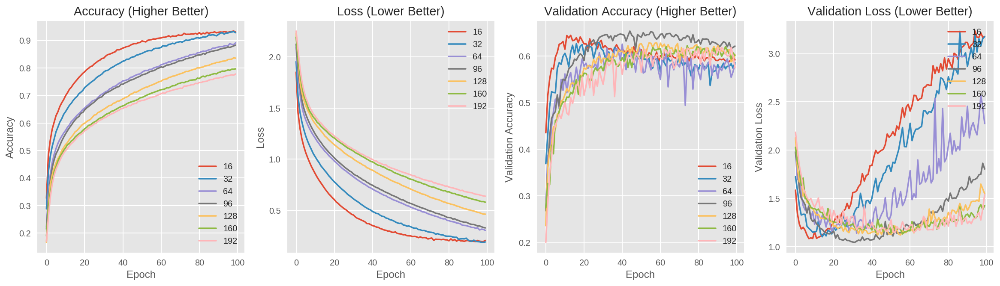

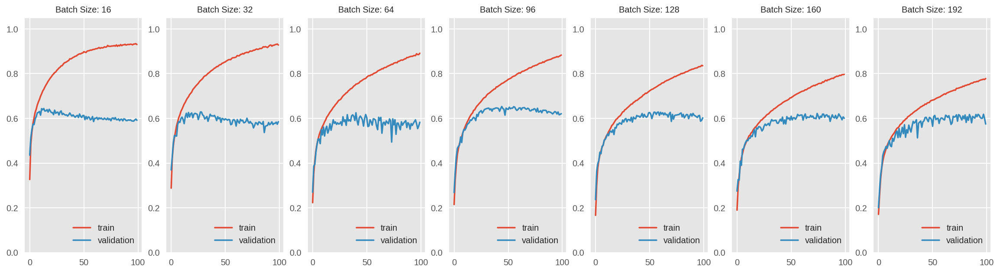

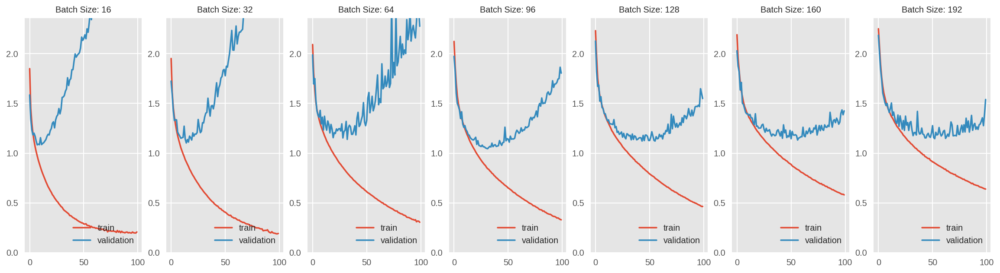

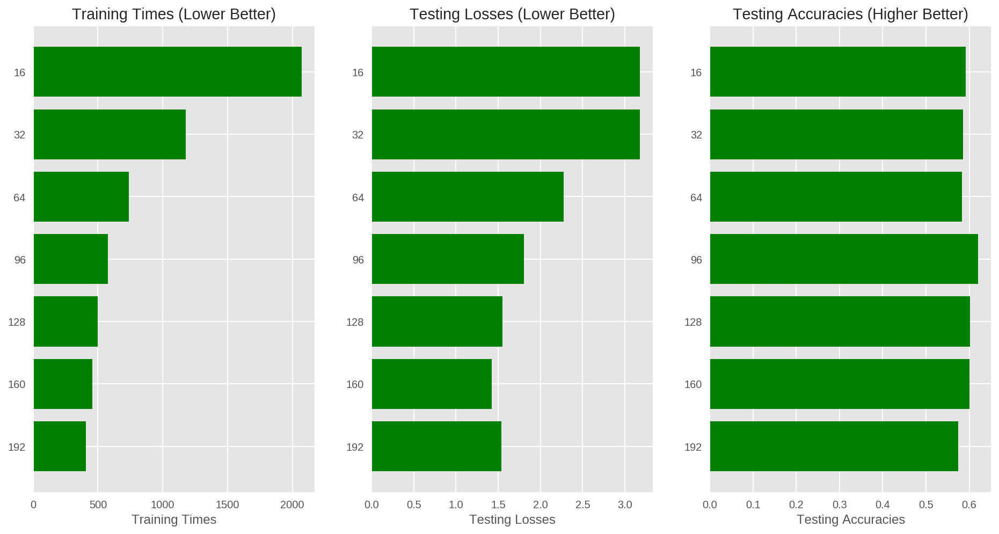

In [0]:
# Plots the results of the Batch Size Hyperparameter Tuning
PlotTuningResults(model_log_list_batch, "Batch Size")

## 7.3. Training Optimization Algorithm

In [0]:
# Perform Optimizer Hyperparameter tuning
optimizer_list = ['SGD', 'RMSprop', 'Adagrad', 'Adadelta', 'Adam', 'Adamax', 'Nadam']

batch_size = 16
epochs = 20

model_log_list_optimizer = TuneModel("optimizer", optimizer_list, batch_size=batch_size, epochs=20)

x_train shape: (50000, 32, 32, 3)
50000 train samples
10000 test samples

Epoch 00001: val_loss improved from inf to 1.62053, saving model to weights_01_1.62.h5

Epoch 00002: val_loss improved from 1.62053 to 1.36287, saving model to weights_02_1.36.h5

Epoch 00003: val_loss improved from 1.36287 to 1.23822, saving model to weights_03_1.24.h5

Epoch 00004: val_loss improved from 1.23822 to 1.19168, saving model to weights_04_1.19.h5

Epoch 00005: val_loss did not improve from 1.19168

Epoch 00006: val_loss did not improve from 1.19168

Epoch 00007: val_loss improved from 1.19168 to 1.15804, saving model to weights_07_1.16.h5

Epoch 00008: val_loss improved from 1.15804 to 1.08643, saving model to weights_08_1.09.h5

Epoch 00009: val_loss did not improve from 1.08643

Epoch 00010: val_loss improved from 1.08643 to 1.07746, saving model to weights_10_1.08.h5

Epoch 00011: val_loss did not improve from 1.07746

Epoch 00012: val_loss improved from 1.07746 to 1.06628, saving model to weight

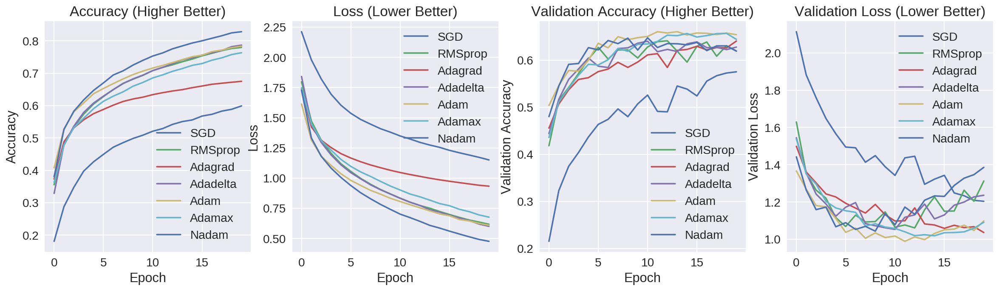

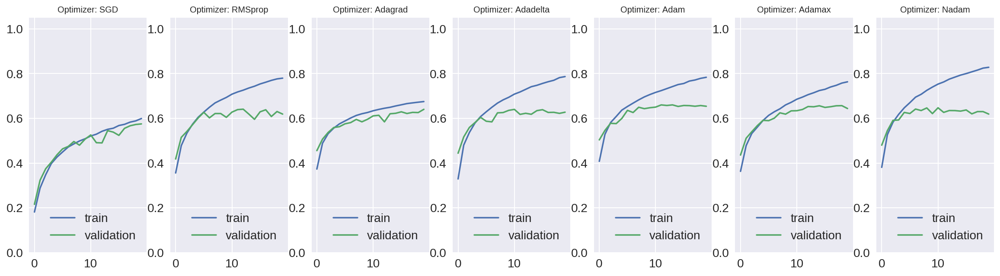

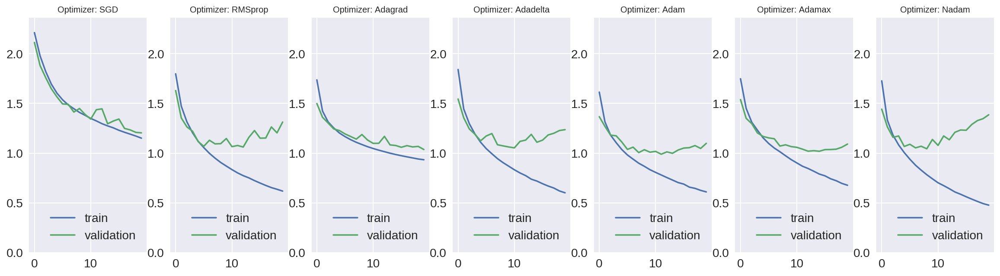

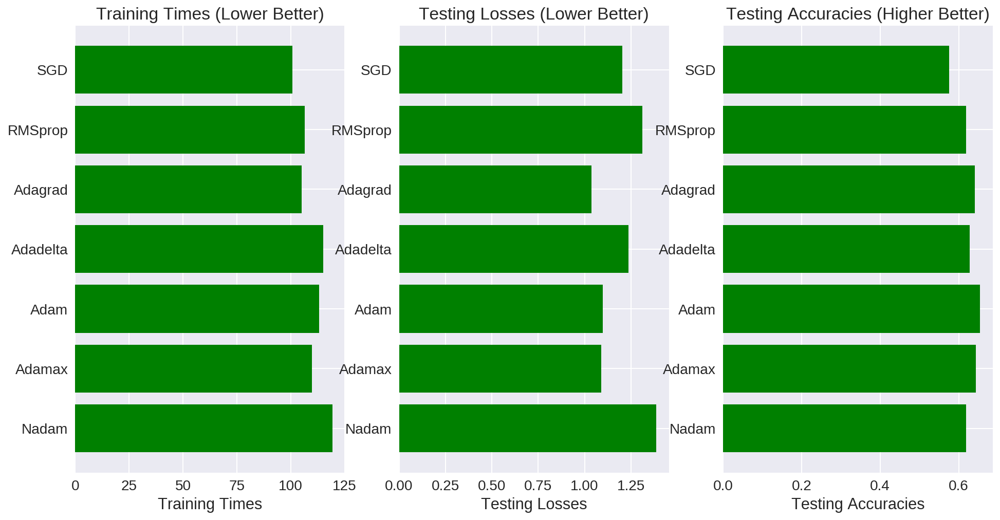

In [0]:
# Plots the results of the Optimizer Hyperparameter Tuning
PlotTuningResults(model_log_list_optimizer, "Optimizer")

## 7.4. Network Weight Initialization

In [0]:
# Perform Network Weight Initialization Hyperparameter tuning

init_mode_list = ['uniform', 'lecun_uniform', 'normal', 'zero', 'glorot_normal', 'glorot_uniform', 'he_normal', 'he_uniform']

batch_size = 16
epochs = 20
optimizer = 'Adagrad'

model_log_list_initmode = TuneModel("init_mode", init_mode_list, batch_size=batch_size, epochs=epochs, optimizer=optimizer)

x_train shape: (50000, 32, 32, 3)
50000 train samples
10000 test samples

Epoch 00001: val_loss improved from inf to 1.51648, saving model to weights_01_1.52.h5

Epoch 00002: val_loss improved from 1.51648 to 1.41186, saving model to weights_02_1.41.h5

Epoch 00003: val_loss improved from 1.41186 to 1.33591, saving model to weights_03_1.34.h5

Epoch 00004: val_loss improved from 1.33591 to 1.28651, saving model to weights_04_1.29.h5

Epoch 00005: val_loss improved from 1.28651 to 1.26610, saving model to weights_05_1.27.h5

Epoch 00006: val_loss improved from 1.26610 to 1.25350, saving model to weights_06_1.25.h5

Epoch 00007: val_loss improved from 1.25350 to 1.20442, saving model to weights_07_1.20.h5

Epoch 00008: val_loss improved from 1.20442 to 1.18944, saving model to weights_08_1.19.h5

Epoch 00009: val_loss improved from 1.18944 to 1.16818, saving model to weights_09_1.17.h5

Epoch 00010: val_loss improved from 1.16818 to 1.15420, saving model to weights_10_1.15.h5

Epoch 0001

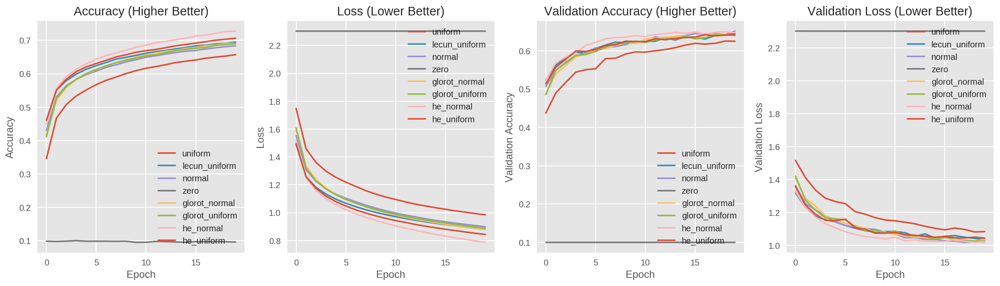

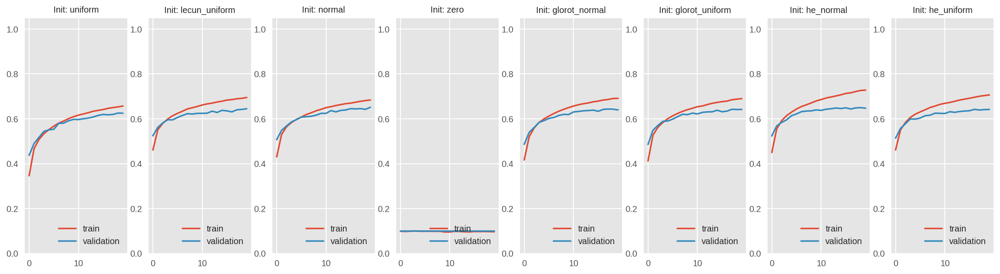

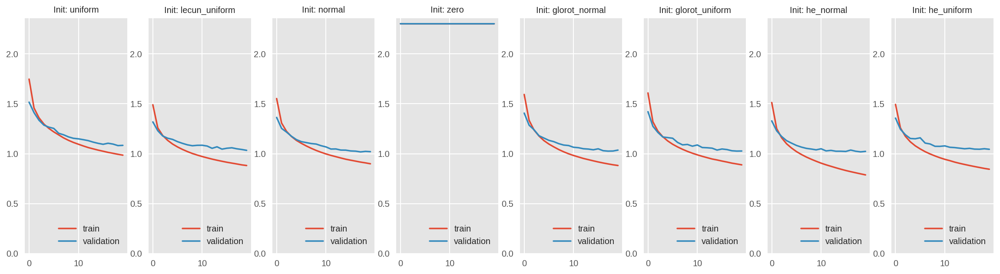

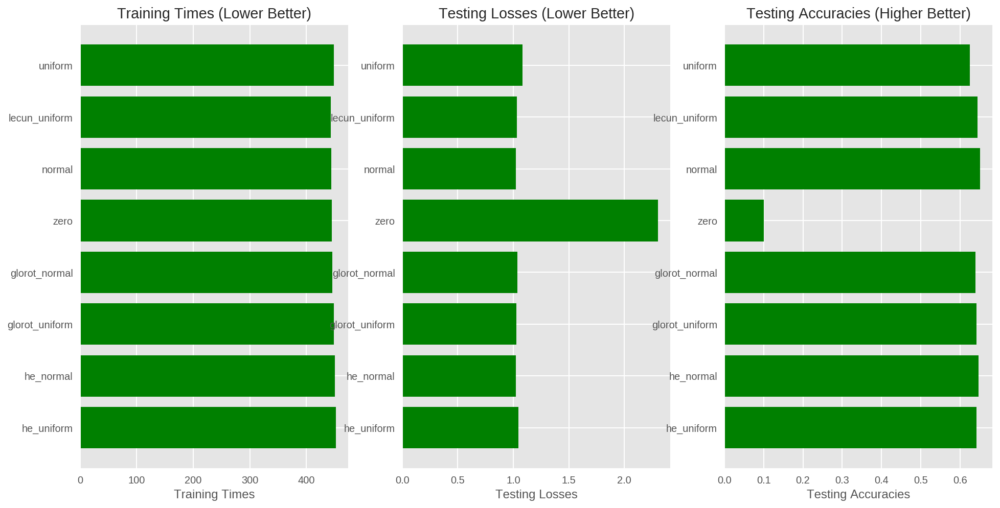

In [0]:
# Plots the results of the Network Weight Initialization Hyperparameter Tuning
PlotTuningResults(model_log_list_initmode, "Init")

## 7.5. Neuron Activation Function

In [31]:
# Perform Neuron Activation Function Hyperparameter tuning

activation_list = ['softmax', 'softplus', 'softsign', 'relu', 'tanh', 'sigmoid', 'hard_sigmoid', 'linear']

batch_size = 16
epochs = 20
optimizer = 'Adagrad'
init_mode = 'he_normal'

model_log_list_activation = TuneModel("activation", activation_list, batch_size=batch_size, epochs=epochs, optimizer=optimizer, init_mode=init_mode)

x_train shape: (50000, 32, 32, 3)
50000 train samples
10000 test samples

Epoch 00001: val_loss improved from inf to 1.97940, saving model to weights_01_1.98.h5

Epoch 00002: val_loss improved from 1.97940 to 1.88242, saving model to weights_02_1.88.h5

Epoch 00003: val_loss improved from 1.88242 to 1.85373, saving model to weights_03_1.85.h5

Epoch 00004: val_loss improved from 1.85373 to 1.82207, saving model to weights_04_1.82.h5

Epoch 00005: val_loss improved from 1.82207 to 1.79292, saving model to weights_05_1.79.h5

Epoch 00006: val_loss improved from 1.79292 to 1.76449, saving model to weights_06_1.76.h5

Epoch 00007: val_loss improved from 1.76449 to 1.74213, saving model to weights_07_1.74.h5

Epoch 00008: val_loss improved from 1.74213 to 1.71873, saving model to weights_08_1.72.h5

Epoch 00009: val_loss improved from 1.71873 to 1.70640, saving model to weights_09_1.71.h5

Epoch 00010: val_loss improved from 1.70640 to 1.68990, saving model to weights_10_1.69.h5

Epoch 0001

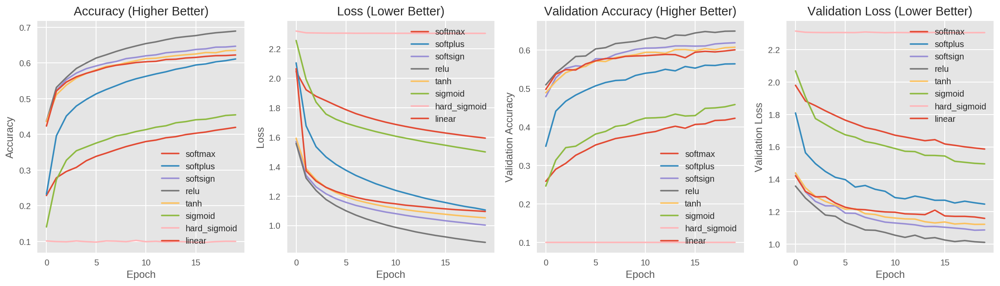

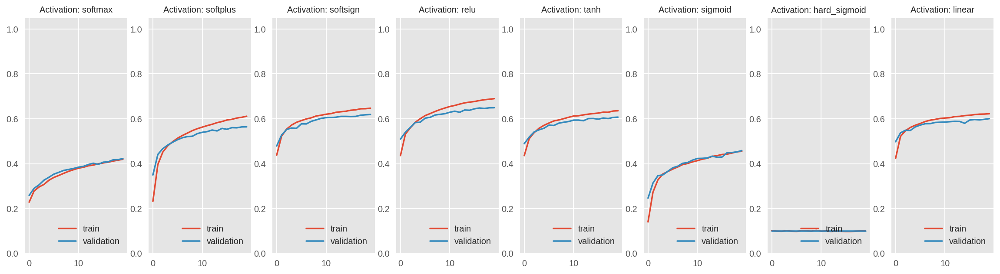

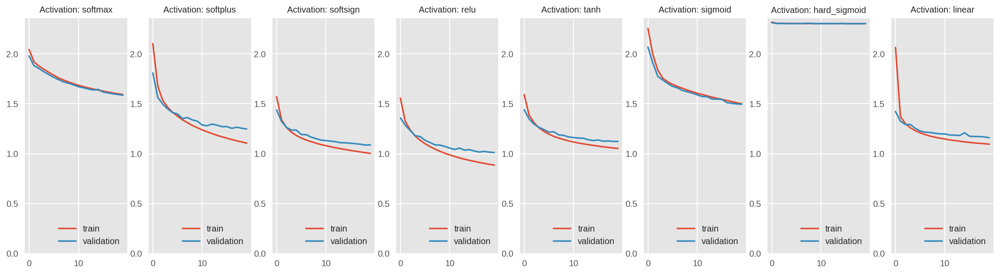

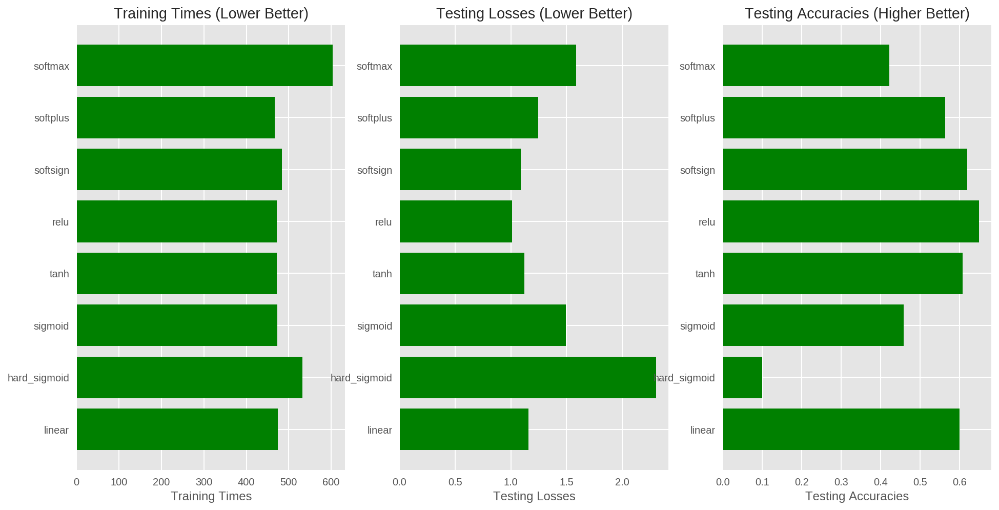

In [32]:
# Plots the results of the Neuron Activation Function Hyperparameter Tuning
PlotTuningResults(model_log_list_activation, "Activation")

## 7.6. Number of Neurons in the Hidden Layer

In [34]:
# Perform Neuron Quantity Hyperparameter tuning

neurons_list = [20, 50, 100, 150, 200, 300, 400, 500, 1000]

batch_size = 16
epochs = 20
optimizer = Adagrad(lr=0.01)
init_mode = 'he_normal'
activation = 'relu'

model_log_list_neurons = TuneModel("neurons", neurons_list, batch_size=batch_size, epochs=epochs, optimizer=optimizer, init_mode=init_mode, activation=activation)

x_train shape: (50000, 32, 32, 3)
50000 train samples
10000 test samples

Epoch 00001: val_loss improved from inf to 1.41618, saving model to weights_01_1.42.h5

Epoch 00002: val_loss improved from 1.41618 to 1.34142, saving model to weights_02_1.34.h5

Epoch 00003: val_loss improved from 1.34142 to 1.29543, saving model to weights_03_1.30.h5

Epoch 00004: val_loss improved from 1.29543 to 1.24144, saving model to weights_04_1.24.h5

Epoch 00005: val_loss improved from 1.24144 to 1.22197, saving model to weights_05_1.22.h5

Epoch 00006: val_loss improved from 1.22197 to 1.20126, saving model to weights_06_1.20.h5

Epoch 00007: val_loss improved from 1.20126 to 1.19300, saving model to weights_07_1.19.h5

Epoch 00008: val_loss improved from 1.19300 to 1.16640, saving model to weights_08_1.17.h5

Epoch 00009: val_loss improved from 1.16640 to 1.15416, saving model to weights_09_1.15.h5

Epoch 00010: val_loss improved from 1.15416 to 1.14731, saving model to weights_10_1.15.h5

Epoch 0001

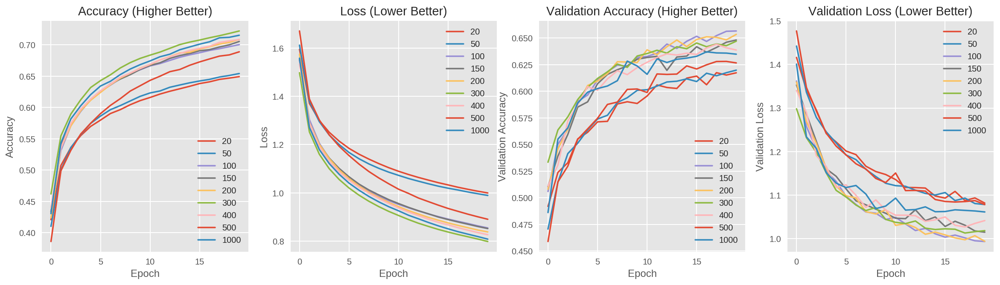

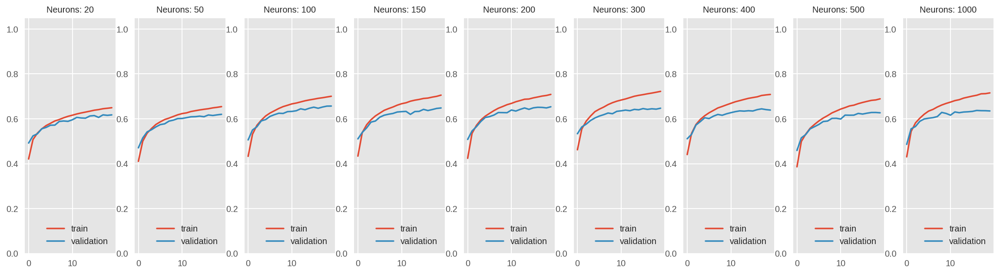

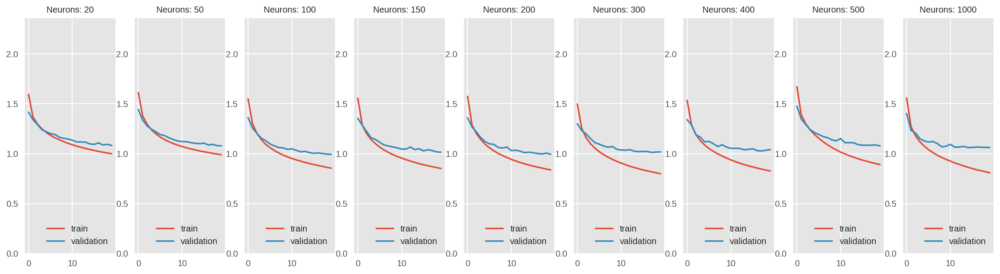

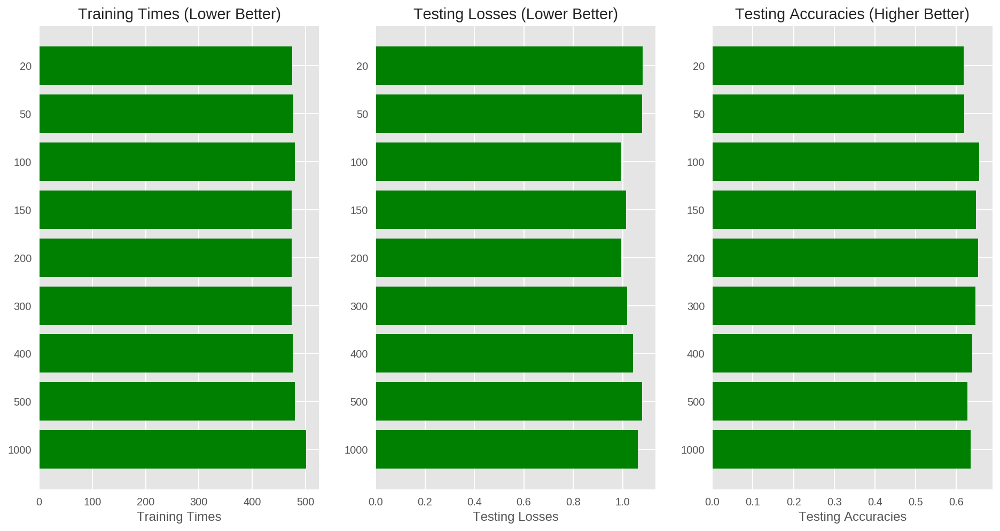

In [35]:
# Plots the results of the Neuron Quantity Hyperparameter Tuning
PlotTuningResults(model_log_list_neurons, "Neurons")